# Задача:
  Создать MVP предсказания дефолта эмитентов облигаций и определения значимых признаков, собранных из REST API Интерфакса. Обеспечить воспроизводимость ноутбука на другом компьютере.

# Итог:
Провел анализ по наличию взаимной информации между признаками и таргетом. Создал признаки, помогающие предсказанию на количественных признаках. Провел оптимизацию датасета для использования в машинном обучении. Провел выбор моделей обучения. Использовал мощные техники машинного обучения по выбору важных признаков.


# Заключение:
Все модели заточены на временные признаки и с этим что-то надо делать. Предлагаю пробовать использовать эти и другие признаки по эмитентам, (например, бухгалтерскую отчетность, макроэкономические, экспертные заключения (текстовые) и др.), распределенные во времени. Например, поквартально. Пробовать запускать эти таблицы в первую очередь в реккурентные нейронные сети.

In [1]:
import numpy as np
import pandas as pd
from scipy.stats import shapiro, mannwhitneyu, chi2_contingency, norm, sem
from sklearn.metrics import roc_auc_score
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score, KFold, train_test_split, GridSearchCV
import category_encoders as ce
from sklearn.preprocessing import LabelEncoder, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LogisticRegression
from inspect import signature
import catboost as catb

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
import shap

# load JS visualization code to notebook
shap.initjs()

In [3]:
df = pd.read_csv("df_after_eda.csv")
df.T

,0,1,2,3,4,5,6,7,8,9,...,480,481,482,483,484,485,486,487,488,489
Ломбардный список БР,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Кол-во дней со сделками за 2 дня,2,2,2,2,2,2,2,2,2,0,...,2,2,2,2,2,2,2,2,2,2
Кол-во дней со сделками за 5 дней,5,5,5,5,5,5,5,5,5,0,...,5,5,5,5,5,4,5,5,5,5
Кол-во дней со сделками за 10 дней,10,10,10,10,10,10,10,10,10,1,...,10,10,10,10,10,5,10,10,10,10
Кол-во купонов в год,2,2,4,1,4,2,4,4,4,4,...,2,2,4,4,12,12,4,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Рейтинг агрег,NAN,NAN,NAN,NAN,BBB(RU),ruA,'ruBBB+,NAN,ruB,NAN,...,ruAA-,NAN,NAN,BBB+(RU),NAN,NAN,NAN,A(RU),NAN,'ruBBB+
pca_1,-538699.107328,-637699.107319,-637699.107329,-637699.107319,-637699.107325,-637699.107311,-637699.107324,-637699.107322,-637699.107334,-637699.10731,...,-637699.107281,-638599.107319,-638698.107319,-637699.107322,-637699.107396,-628699.107406,-638698.107319,-637699.107312,-637699.107319,-637699.107328
pca_2,-2018.483944,-2019.828483,-2019.074187,-2019.828483,-2019.439934,-2020.436289,-2019.454961,-2019.626356,-2018.74473,-2020.489652,...,-2022.651874,-2019.840709,-2019.842051,-2019.649341,-2014.199649,-2013.381833,-2019.842051,-2020.37594,-2019.828491,-2019.179157
pca_3,-15.569608,-15.58019,-15.712466,-15.580208,-15.697176,-15.518673,-15.691377,-15.696363,-15.72228,-14.225152,...,-15.014982,-15.580292,-15.580292,-15.67665,-13.822141,-15.907328,-15.580292,-15.657765,-15.580201,-15.659489


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 490 entries, 0 to 489
Data columns (total 69 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Ломбардный список БР                490 non-null    int64  
 1   Кол-во дней со сделками за 2 дня    490 non-null    int64  
 2   Кол-во дней со сделками за 5 дней   490 non-null    int64  
 3   Кол-во дней со сделками за 10 дней  490 non-null    int64  
 4   Кол-во купонов в год                490 non-null    int64  
 5   Амортизируемость                    490 non-null    int64  
 6   Конвертация                         490 non-null    int64  
 7   Закрытая подписка                   490 non-null    int64  
 8   target                              490 non-null    int64  
 9   not_isin                            490 non-null    int64  
 10  Encumbrance                         490 non-null    int64  
 11  Дата начала размещения_dow          490 non-n

In [5]:
df.drop('target.1', axis=1, inplace=True)

In [6]:
# при загрузке датасета признаки из spy_list опять преобразовались в числа
numerical_features = df.select_dtypes(include=[np.number])
numerical_features

,Ломбардный список БР,Кол-во дней со сделками за 2 дня,Кол-во дней со сделками за 5 дней,Кол-во дней со сделками за 10 дней,Кол-во купонов в год,Амортизируемость,Конвертация,Закрытая подписка,target,not_isin,...,Дата начала размещения_month,Дата начала размещения_year,Дата окончания размещения_month,Дата окончания размещения_year,Дата погашения_month,Дата регистрации_month,Дата регистрации_year,pca_1,pca_2,pca_3
0,0,2,5,10,2,0,0,1,0,0,...,11,2019,11,2019,10,10,2019,-538699.107328,-2018.483944,-15.569608
1,0,2,5,10,2,0,0,1,0,0,...,9,2021,2,2022,8,8,2021,-637699.107319,-2019.828483,-15.580190
2,0,2,5,10,4,0,0,1,0,0,...,1,2022,4,2022,1,10,2021,-637699.107329,-2019.074187,-15.712466
3,0,2,5,10,1,0,0,1,0,0,...,8,2019,8,2019,12,7,2019,-637699.107319,-2019.828483,-15.580208
4,0,2,5,10,4,1,0,0,0,0,...,2,2023,2,2023,1,9,2022,-637699.107325,-2019.439934,-15.697176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,0,2,4,5,12,1,0,1,0,0,...,3,2021,3,2021,1,1,2021,-628699.107406,-2013.381833,-15.907328
486,0,2,5,10,4,0,0,1,1,1,...,7,2009,7,2009,7,7,2009,-638698.107319,-2019.842051,-15.580292
487,0,2,5,10,2,1,0,0,0,0,...,4,2021,4,2021,4,3,2021,-637699.107312,-2020.375940,-15.657765
488,0,2,5,10,2,1,0,1,0,0,...,11,2015,2,2016,11,2,2015,-637699.107319,-2019.828491,-15.580201


In [7]:
spy_list = ['Ломбардный список БР', 'Кол-во дней со сделками за 2 дня',
       'Кол-во дней со сделками за 5 дней',
       'Кол-во дней со сделками за 10 дней', 'Кол-во купонов в год',
       'Амортизируемость', 'Конвертация', 'Закрытая подписка',
       'not_isin', 'Encumbrance', 'Дата начала размещения_dow',
       'Дата ближ. возм. погаш._dow', 'Дата погашения_dow',
       'Дата окончания размещения_dow', 'Дата регистрации_dow',
       'Дата гос. рег-ции/присвоения_dow', 'Дата ближ. купона_year',
       'Дата ближ. купона_dow', 'Дата начала размещения_day',
       'Дата ближ. возм. погаш._year', 'Дата ближ. возм. погаш._day',
       'Дата погашения_year', 'Дата погашения_day',
       'Дата окончания размещения_day', 'Дата регистрации_day',
       'Дата гос. рег-ции/присвоения_day', 'Дата ближ. купона_day',
       'Дата ближ. возм. погаш._month', 'Дата ближ. купона_month',
       'Дата гос. рег-ции/присвоения_month',
       'Дата гос. рег-ции/присвоения_year', 'Дата начала размещения_month',
       'Дата начала размещения_year', 'Дата окончания размещения_month',
       'Дата окончания размещения_year', 'Дата погашения_month',
       'Дата регистрации_month', 'Дата регистрации_year']

In [8]:
df[spy_list] = df[spy_list].astype('object')

In [9]:
numerical_features = df.select_dtypes(include=[np.number])
numerical_features.T

,0,1,2,3,4,5,6,7,8,9,...,480,481,482,483,484,485,486,487,488,489
target,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
pca_1,-538699.107328,-637699.107319,-637699.107329,-637699.107319,-637699.107325,-637699.107311,-637699.107324,-637699.107322,-637699.107334,-637699.107310,...,-637699.107281,-638599.107319,-638698.107319,-637699.107322,-637699.107396,-628699.107406,-638698.107319,-637699.107312,-637699.107319,-637699.107328
pca_2,-2018.483944,-2019.828483,-2019.074187,-2019.828483,-2019.439934,-2020.436289,-2019.454961,-2019.626356,-2018.744730,-2020.489652,...,-2022.651874,-2019.840709,-2019.842051,-2019.649341,-2014.199649,-2013.381833,-2019.842051,-2020.375940,-2019.828491,-2019.179157
pca_3,-15.569608,-15.580190,-15.712466,-15.580208,-15.697176,-15.518673,-15.691377,-15.696363,-15.722280,-14.225152,...,-15.014982,-15.580292,-15.580292,-15.676650,-13.822141,-15.907328,-15.580292,-15.657765,-15.580201,-15.659489


# Поиск взаимной информации между количественными признаками и таргетом.




pca_1


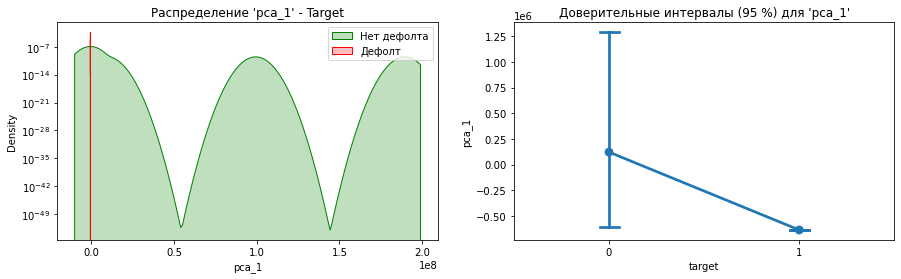

Параметрический критерий Шапиро-Уилка pvalue = 0.0000.
Распределение не нормальное.
Непараметрический критерий Манна-Уитни pvalue = 0.0000
Согласно значению p-value, гипотеза о равности мат. ожиданий отвергается.



pca_2


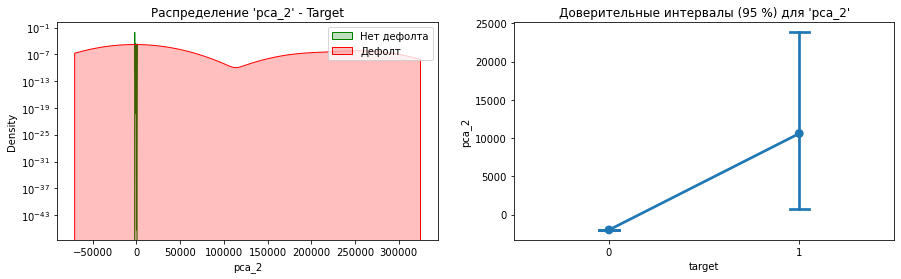

Параметрический критерий Шапиро-Уилка pvalue = 0.0000.
Распределение не нормальное.
Непараметрический критерий Манна-Уитни pvalue = 0.4792
Согласно значению p-value, гипотеза о равности мат. ожиданий подтверждается.



pca_3


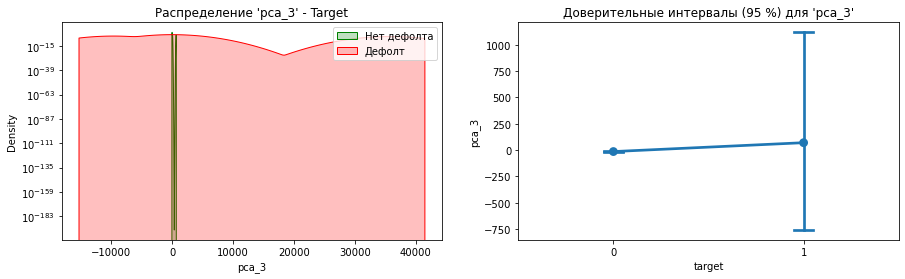

Параметрический критерий Шапиро-Уилка pvalue = 0.0000.
Распределение не нормальное.
Непараметрический критерий Манна-Уитни pvalue = 0.0010
Согласно значению p-value, гипотеза о равности мат. ожиданий отвергается.


In [10]:
TARGET_NAME='target'
features = ['pca_1', 'pca_2', 'pca_3']
for feature_name in features:
    print("\n\n")
    print(feature_name)
    feature_with_target = numerical_features[[feature_name, TARGET_NAME]]
    feature = feature_with_target[feature_name]
    feature_target_0 = feature[feature_with_target[TARGET_NAME] == 0]
    feature_target_1 = feature[feature_with_target[TARGET_NAME] == 1]

    plt.figure(figsize=(15, 4))
    ax1 = plt.subplot(121)
    ax1.set_yscale('log')
    sns.kdeplot(feature_target_0, shade=True, label='Нет дефолта', color='g')
    sns.kdeplot(feature_target_1, shade=True, label='Дефолт', color='r')
    ax1.set_xlabel(feature_name)
    ax1.set_title(f"Распределение '{feature_name}' - Target")
    ax1.legend()

    ax2 = plt.subplot(122)
    sns.pointplot(x=TARGET_NAME, y=feature_name, data=feature_with_target, capsize=.1)
    ax2.set_title(f"Доверительные интервалы (95 %) для '{feature_name}'")

    plt.show()

    _, shapiro_pvalue = shapiro(feature)
    print(f"Параметрический критерий Шапиро-Уилка pvalue = {shapiro_pvalue:.4f}.")
    if shapiro_pvalue < 0.05:
        print(f"Распределение не нормальное.")
    else:
        print(f"Распределение нормальное.")

    _, mannwhitneyu_pvalue = mannwhitneyu(feature_target_0, feature_target_1)
    print(f"Непараметрический критерий Манна-Уитни pvalue = {mannwhitneyu_pvalue:.4f}")
    if mannwhitneyu_pvalue < 0.05:
        print("Согласно значению p-value, гипотеза о равности мат. ожиданий отвергается.")
    else:
        print("Согласно значению p-value, гипотеза о равности мат. ожиданий подтверждается.")

Из распределений видно, что для предсказаний эти признаки можно попробовать дополнить категориальными. Ниже создаю их.

In [11]:
print(f"target=1_min: {df.loc[df['target']==1]['pca_1'].min()}")
print(f"target=0_min: {df.loc[df['target']==0]['pca_1'].min()}")
print(f"target=1_max: {df.loc[df['target']==1]['pca_1'].max()}")
print(f"target=0_max: {df.loc[df['target']==0]['pca_1'].max()}")

target=1_min: -638698.10731912
target=0_min: -638698.10731912
target=1_max: -628699.1073200675
target=0_max: 189561300.8751386


In [12]:
# доверительный интервал 95% для единиц
norm.interval(alpha=0.95,
                 loc=np.mean(df.loc[df['target']==1]['pca_1']),
                 scale=sem(df.loc[df['target']==1]['pca_1']))

(-638240.1854083973, -637539.6028905166)

In [13]:
# доверительный интервал 95% для нулей
norm.interval(alpha=0.95,
                 loc=np.mean(df.loc[df['target']==0]['pca_1']),
                 scale=sem(df.loc[df['target']==0]['pca_1']))

(-901487.0654800349, 1143018.1904492467)

In [14]:
# Создам  признак, отделяющий нули по таргету
df['pca_1_0_max'] = None
df['pca_1_0_max'] = df.apply(lambda x: 1 if x['pca_1'] > -637539.6028905166 else 0, axis=1)
df['pca_1_0_max'].value_counts()

0    457
1     33
Name: pca_1_0_max, dtype: int64

In [15]:
# Создам  признак, отделяющий нули по таргету
df['pca_1_0_min'] = None
df['pca_1_0_min'] = df.apply(lambda x: 1 if x['pca_1'] < -638240.1854083973 else 0, axis=1)
df['pca_1_0_min'].value_counts()

0    438
1     52
Name: pca_1_0_min, dtype: int64

In [16]:
print(f"target=1_min: {df.loc[df['target']==1]['pca_2'].min()}")
print(f"target=0_min: {df.loc[df['target']==0]['pca_2'].min()}")
print(f"target=1_max: {df.loc[df['target']==1]['pca_2'].max()}")
print(f"target=0_max: {df.loc[df['target']==0]['pca_2'].max()}")

target=1_min: -2019.8420512077305
target=0_min: -2029.3219590587664
target=1_max: 256242.55089907823
target=0_max: 563.3020203467081


In [17]:
# доверительный интервал 95% для единиц
norm.interval(alpha=0.95,
                 loc=np.mean(df.loc[df['target']==1]['pca_2']),
                 scale=sem(df.loc[df['target']==1]['pca_2']))

(-1555.0671724168897, 22761.538455782327)

In [18]:
# доверительный интервал 95% для нулей
norm.interval(alpha=0.95,
                 loc=np.mean(df.loc[df['target']==0]['pca_2']),
                 scale=sem(df.loc[df['target']==0]['pca_2']))

(-2021.5813922964448, -1993.235986593129)

In [19]:
# Создам признак, отделяющий единицы по таргету
df['pca_2_1_max'] = None
df['pca_2_1_max'] = df.apply(lambda x: 1 if x['pca_2'] > -1993.235986593129 else 0, axis=1)
df['pca_2_1_max'].value_counts()

0    473
1     17
Name: pca_2_1_max, dtype: int64

In [20]:
# Создам признак, отделяющий нули по таргету
df['pca_2_1_min'] = None
df['pca_2_1_min'] = df.apply(lambda x: 1 if x['pca_2'] < -1555.0671724168897 else 0, axis=1)
df['pca_2_1_min'].value_counts()

1    482
0      8
Name: pca_2_1_min, dtype: int64

In [21]:
print(f"target=1_min: {df.loc[df['target']==1]['pca_3'].min()}")
print(f"target=0_min: {df.loc[df['target']==0]['pca_3'].min()}")
print(f"target=1_max: {df.loc[df['target']==1]['pca_3'].max()}")
print(f"target=0_max: {df.loc[df['target']==0]['pca_3'].max()}")

target=1_min: -9633.90694642176
target=0_min: -16.871060102482463
target=1_max: 35808.9398636202
target=0_max: 647.4176630650239


In [22]:
# доверительный интервал 95% для единиц
norm.interval(alpha=0.95,
                 loc=np.mean(df.loc[df['target']==1]['pca_3']),
                 scale=sem(df.loc[df['target']==1]['pca_3']))

(-928.2207029339786, 1069.8152185672468)

In [23]:
# доверительный интервал 95% для нулей
norm.interval(alpha=0.95,
                 loc=np.mean(df.loc[df['target']==0]['pca_3']),
                 scale=sem(df.loc[df['target']==0]['pca_3']))

(-16.591568106569657, -10.215160581286462)

In [24]:
# Создам  признак, отделяющий единицы по таргету
df['pca_3_0_min'] = None
df['pca_3_0_min'] = df.apply(lambda x: 1 if x['pca_3'] < -16.591568106569657 else 0, axis=1)
df['pca_3_0_min'].value_counts()

0    481
1      9
Name: pca_3_0_min, dtype: int64

In [25]:
df['pca_3_0_max'] = None
df['pca_3_0_max'] = df.apply(lambda x: 1 if x['pca_3'] > -10.215160581286462 else 0, axis=1)
df['pca_3_0_max'].value_counts()

0    480
1     10
Name: pca_3_0_max, dtype: int64

# Поиск взаимной информации между категориальными признаками и таргетом.

In [26]:
df['id'] = df.index

In [27]:
df['id'] = df['id'].astype("str")

In [28]:
def chi_2_box(df, feature, TARGET_NAME):
    """Функция предсказания наличия взаимной информации  с таргетом у категориальных признаков"""

    df_for_table = df[['id', feature, TARGET_NAME]]
    table = df_for_table.pivot_table(values='id', index = feature, 
                                     columns= TARGET_NAME, aggfunc='count')

    chi2, p, _, _ = chi2_contingency(table)
    print(f"p_value chi_2: {p}")
    print(f"Распределение внутри признака: {df[feature].value_counts()}")

    fig = px.box(df, color = TARGET_NAME, y = feature, points="all",title = feature)
    fig.show()

In [29]:
categorical_features = df.select_dtypes(exclude=[np.number])
categorical_features.T

,0,1,2,3,4,5,6,7,8,9,...,480,481,482,483,484,485,486,487,488,489
Ломбардный список БР,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Кол-во дней со сделками за 2 дня,2,2,2,2,2,2,2,2,2,0,...,2,2,2,2,2,2,2,2,2,2
Кол-во дней со сделками за 5 дней,5,5,5,5,5,5,5,5,5,0,...,5,5,5,5,5,4,5,5,5,5
Кол-во дней со сделками за 10 дней,10,10,10,10,10,10,10,10,10,1,...,10,10,10,10,10,5,10,10,10,10
Кол-во купонов в год,2,2,4,1,4,2,4,4,4,4,...,2,2,4,4,12,12,4,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Тип бумаги (МСП, Корп., Гос.)",M,M,M,M,C,C,C,M,M,M,...,C,M,M,C,M,M,M,C,C,C
Сектор повышенного инвест. риска,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,ДА,ДА,ДА,...,НЕТ,НЕТ,НЕТ,НЕТ,ДА,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ
Сектор роста,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,...,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ,НЕТ
Рейтинг агрег,NAN,NAN,NAN,NAN,BBB(RU),ruA,'ruBBB+,NAN,ruB,NAN,...,ruAA-,NAN,NAN,BBB+(RU),NAN,NAN,NAN,A(RU),NAN,'ruBBB+


In [30]:
cats = list(categorical_features.columns)
cats

['Ломбардный список БР',
 'Кол-во дней со сделками за 2 дня',
 'Кол-во дней со сделками за 5 дней',
 'Кол-во дней со сделками за 10 дней',
 'Кол-во купонов в год',
 'Амортизируемость',
 'Конвертация',
 'Закрытая подписка',
 'not_isin',
 'Encumbrance',
 'Дата начала размещения_dow',
 'Дата ближ. возм. погаш._dow',
 'Дата погашения_dow',
 'Дата окончания размещения_dow',
 'Дата регистрации_dow',
 'Дата гос. рег-ции/присвоения_dow',
 'Дата ближ. купона_year',
 'Дата ближ. купона_dow',
 'Дата начала размещения_day',
 'Дата ближ. возм. погаш._year',
 'Дата ближ. возм. погаш._day',
 'Дата погашения_year',
 'Дата погашения_day',
 'Дата окончания размещения_day',
 'Дата регистрации_day',
 'Дата гос. рег-ции/присвоения_day',
 'Дата ближ. купона_day',
 'Дата ближ. возм. погаш._month',
 'Дата ближ. купона_month',
 'Дата гос. рег-ции/присвоения_month',
 'Дата гос. рег-ции/присвоения_year',
 'Дата начала размещения_month',
 'Дата начала размещения_year',
 'Дата окончания размещения_month',
 'Дата о

In [31]:
cats.remove('id')

In [32]:
for col in cats:
    chi_2_box(df, col, TARGET_NAME)

invalid value encountered in less


p_value chi_2: nan
Распределение внутри признака: 0    458
1     32
Name: Ломбардный список БР, dtype: int64


p_value chi_2: 0.020796154990610275
Распределение внутри признака: 2    405
0     66
1     19
Name: Кол-во дней со сделками за 2 дня, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 5    398
0     64
4     11
1      9
2      4
3      4
Name: Кол-во дней со сделками за 5 дней, dtype: int64


/home/jb/anaconda3/lib/python3.8/site-packages/scipy/stats/contingency.py:266: RuntimeWarning:

invalid value encountered in less



p_value chi_2: nan
Распределение внутри признака: 10    391
0      60
1      12
8      10
9       5
7       4
4       3
5       3
3       1
2       1
Name: Кол-во дней со сделками за 10 дней, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 4     264
2     113
12     68
1      43
0       1
6       1
Name: Кол-во купонов в год, dtype: int64


p_value chi_2: 2.495629644178721e-05
Распределение внутри признака: 0    345
1    145
Name: Амортизируемость, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 0    489
1      1
Name: Конвертация, dtype: int64


p_value chi_2: 0.004456419829555869
Распределение внутри признака: 0    323
1    167
Name: Закрытая подписка, dtype: int64


p_value chi_2: 4.757118523514174e-20
Распределение внутри признака: 0    437
1     53
Name: not_isin, dtype: int64


p_value chi_2: 8.000062957027396e-10
Распределение внутри признака: 0    327
1    163
Name: Encumbrance, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2    140
0    113
3     89
1     80
6     66
4      2
Name: Дата начала размещения_dow, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2    105
0    100
1     78
6     74
3     59
5     48
4     26
Name: Дата ближ. возм. погаш._dow, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 0    100
2    100
6     76
1     70
3     59
5     54
4     31
Name: Дата погашения_dow, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2    123
3    106
0    102
1     87
6     67
5      3
4      2
Name: Дата окончания размещения_dow, dtype: int64


p_value chi_2: 8.062165896633964e-08
Распределение внутри признака: 2    146
0    114
6    101
3     69
1     60
Name: Дата регистрации_dow, dtype: int64


p_value chi_2: 0.0005085906368053601
Распределение внутри признака: 6    155
2    126
0     82
3     69
1     58
Name: Дата гос. рег-ции/присвоения_dow, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2023    466
2032      9
2027      4
2025      4
2029      3
2026      2
2031      1
2024      1
Name: Дата ближ. купона_year, dtype: int64


p_value chi_2: 1.226629497897451e-19
Распределение внутри признака: 6    182
0     94
2     92
3     62
1     60
Name: Дата ближ. купона_dow, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 22    45
21    26
3     25
15    23
26    22
28    20
27    18
17    17
23    17
19    16
9     16
2     15
13    15
11    15
29    15
14    15
30    15
20    14
4     14
25    13
16    13
7     13
8     12
24    12
5     11
1     10
10    10
6      9
12     9
18     9
31     6
Name: Дата начала размещения_day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2025    94
2024    87
2023    65
2034    48
2026    48
2027    26
2021    23
2022    16
2032    10
2020    10
2019     9
2018     8
2029     8
2028     7
2030     7
2017     5
2031     3
2052     2
2036     2
2047     2
2045     2
2053     1
2050     1
2033     1
2037     1
2054     1
2015     1
2058     1
2046     1
Name: Дата ближ. возм. погаш._year, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 22    57
3     31
14    21
23    19
25    18
26    18
11    17
12    17
28    16
30    16
19    16
17    16
18    16
5     15
21    15
9     15
15    15
16    14
29    14
20    13
10    12
7     12
13    11
6     11
2     11
27    11
24    10
4     10
1      9
8      7
31     7
Name: Дата ближ. возм. погаш._day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2025    99
2024    82
2026    68
2034    48
2027    39
2023    32
2029    19
2032    18
2028    15
2030    14
2021    10
2031     9
2020     7
2022     6
2033     5
2037     3
2036     3
2045     2
2052     2
2038     2
2047     2
2046     1
2053     1
2050     1
2054     1
2065     1
Name: Дата погашения_year, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 22    49
3     30
14    20
17    20
9     18
13    17
21    17
11    17
23    17
28    16
12    16
25    16
30    16
10    15
2     15
16    15
19    15
26    14
18    14
20    14
24    14
15    14
7     13
5     12
4     12
27    12
6     10
29    10
8      9
1      8
31     5
Name: Дата погашения_day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 22    48
21    34
26    23
28    23
2     21
17    20
14    20
30    19
15    19
23    19
20    18
19    17
9     16
29    16
16    15
11    14
12    13
5     13
24    12
13    12
8     12
27    11
18    11
25    10
1      9
4      9
6      9
10     8
7      7
3      7
31     5
Name: Дата окончания размещения_day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 20    49
2     32
25    24
22    22
13    21
26    21
27    18
19    17
1     17
12    17
7     16
14    15
15    15
3     15
9     15
8     14
17    14
24    13
21    13
10    12
29    12
30    12
6     11
16    11
4     11
28    10
31    10
18    10
11     9
5      7
23     7
Name: Дата регистрации_day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 25    77
13    21
22    21
26    21
27    18
20    18
19    17
1     17
12    17
7     16
9     15
2     15
14    15
15    15
17    14
3     14
24    13
8     13
21    12
10    12
29    12
6     11
4     11
30    11
16    11
31    10
18    10
28    10
11     9
5      7
23     7
Name: Дата гос. рег-ции/присвоения_day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 19    109
26     23
28     23
12     21
22     21
30     18
16     17
14     16
9      16
27     16
5      16
23     15
17     15
10     14
15     14
8      13
21     12
1      12
29     12
13     12
20     11
18     10
24     10
3      10
2       9
25      7
4       6
31      5
6       4
11      3
Name: Дата ближ. купона_day, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 12    75
9     61
7     57
6     42
2     36
8     35
10    34
11    34
4     34
3     32
5     27
1     23
Name: Дата ближ. возм. погаш._month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 3     238
5      90
4      66
6      37
8      16
7      12
12     10
9       8
11      7
2       2
1       2
10      2
Name: Дата ближ. купона_month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 12    134
11     46
10     42
9      40
6      40
7      34
8      33
2      30
4      26
5      25
3      24
1      16
Name: Дата гос. рег-ции/присвоения_month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2022    179
2021    117
2020     51
2019     41
2017     20
2023     15
2015     15
2018     14
2014     13
2016     11
2013      6
2012      5
2011      2
2009      1
Name: Дата гос. рег-ции/присвоения_year, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 12    82
9     63
7     57
8     43
10    41
6     41
11    39
2     35
4     29
3     27
5     17
1     16
Name: Дата начала размещения_month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2022    129
2021    112
2020     54
2009     48
2019     35
2023     24
2016     18
2018     16
2017     16
2015     12
2014     11
2012      6
2013      5
2011      2
2005      1
2000      1
Name: Дата начала размещения_year, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 12    86
7     65
9     52
11    41
2     40
6     39
4     34
8     34
10    33
3     27
1     20
5     19
Name: Дата окончания размещения_month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2022    122
2021    103
2009     51
2020     50
2023     43
2019     34
2016     20
2018     16
2017     15
2014     11
2015      9
2012      6
2013      5
2011      2
2024      2
2001      1
Name: Дата окончания размещения_year, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 12    72
9     59
7     59
11    45
6     39
8     38
10    35
5     30
2     29
4     29
3     29
1     26
Name: Дата погашения_month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 12    82
7     65
9     57
11    47
10    42
6     40
8     36
2     30
4     26
5     25
3     24
1     16
Name: Дата регистрации_month, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 2022    125
2021    117
2020     52
2009     49
2019     41
2017     20
2023     15
2015     15
2018     14
2014     13
2016     11
2013      7
2012      6
2011      2
2010      1
2005      1
2000      1
Name: Дата регистрации_year, dtype: int64


p_value chi_2: nan
Распределение внутри признака: В обращении    412
Дефолт          78
Name: Статус, dtype: int64


p_value chi_2: 0.226282592438571
Распределение внутри признака: Placed          471
In placement     14
Redeemed          5
Name: Состояние бумаги, eng., dtype: int64


p_value chi_2: nan
Распределение внутри признака: DBFUFB    237
DBVUFB    131
DBFGFB     26
DBVGFB     15
DBFSFB     15
DEXXXX     15
DBVXFB     12
DBFXFB      8
DBVSFB      7
DGFSFB      5
DSXXXX      5
DBFXFR      4
DNFXFR      3
DGVXFB      2
DBVXXB      1
DGVSFB      1
DBFTFB      1
DBVXFR      1
DBZUFB      1
Name: CFI, dtype: int64


p_value chi_2: nan
Распределение внутри признака: RU    489
CY      1
Name: Страна заемщика, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Финанс.сервисы                  122
Строительство                    41
Ритейл                           37
Пищевая промышленность и с/х     33
Технологии                       29
Фин.сервис - Лизинг              29
Машиностроение                   27
Прочие                           18
Транспорт                        16
Недвижимость                     15
Нефтегазовый                     15
Банки                            14
ЖКХ                              13
Химпром, минудобрения            11
Металлургический                 11
Государственные                  10
Телекоммуникации                  9
Фин.сервис - ИК, ФК               8
Электроэнергетика                 6
Фин.сервис - УК, НПФ, ПИФ         5
Фармацевтика                      4
Путешествия, досуг                4
Медицина, здоровье                3
Горнодобыча                       3
Автомобили и запчасти             2
Лёгкая промышленность             2
Леспром, бумаг

p_value chi_2: nan
Распределение внутри признака: г.Москва                           231
Республика Татарстан                57
г.Санкт-Петербург                   30
Новосибирская область               20
Московская область                  17
Свердловская область                13
Краснодарский край                  12
Самарская область                    8
Челябинская область                  7
Тюменская область                    7
Саратовская область                  5
Нижегородская область                5
Ростовская область                   5
Красноярский край                    5
Пермский край                        4
Приморский край                      4
Иркутская область                    3
Омская область                       3
Волгоградская область                3
Республика Саха (Якутия)             3
Томская область                      3
Республика Башкортостан              3
Оренбургская область                 3
Пензенская область                   3
Алтайский край

p_value chi_2: nan
Распределение внутри признака: Финанс.сервисы                  133
Строительство                    40
Ритейл                           37
Пищевая промышленность и с/х     33
Технологии                       30
Фин.сервис - Лизинг              29
Машиностроение                   26
Транспорт                        16
Недвижимость                     15
Нефтегазовый                     15
Прочие                           13
ЖКХ                              12
Химпром, минудобрения            11
Металлургический                 11
Государственные                  10
Телекоммуникации                  9
Фин.сервис - ИК, ФК               8
Фин.сервис - ИА                   8
Фин.сервис - УК, НПФ, ПИФ         5
Электроэнергетика                 5
Банки                             4
Фармацевтика                      4
Путешествия, досуг                4
Медицина, здоровье                3
Горнодобыча                       3
Автомобили и запчасти             2
Лёгкая промышл

p_value chi_2: 5.874592125215606e-07
Распределение внутри признака: Среднесрочные    177
Долгосрочные     169
Краткосрочные    144
Name: Срок обращения, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Постоянный       227
Переменный       111
Плавающий         53
Дисконт           49
Прочий            28
Фиксированный     15
Ипотечный          7
Name: Тип купона, dtype: int64


p_value chi_2: nan
Распределение внутри признака: RUB    475
USD     12
CNY      3
Name: Валюта номинала, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Корп    480
Муни     10
Name: Тип облигации, dtype: int64


p_value chi_2: 3.212691453087693e-07
Распределение внутри признака: Биржевые        264
Классические    180
Коммерческие     46
Name: Вид облигации, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Да, после тестирования    358
Нет                       129
Да                          3
Name: Для неквал. инвесторов, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Book-entry                   365
bearer                       117
certificated registered        6
uncertificated registered      2
Name: Форма выпуска, eng, dtype: int64


p_value chi_2: 0.00014752056087648412
Распределение внутри признака: Подписка открытая    365
Подписка закрытая    125
Name: Способ размещения, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Облигации прочих резидентов                                                                           457
Структурные долговые ценные бумаги прочих резидентов                                                   20
Облигации органов исполнительной власти субъектов Российской Федерации и муниципальных образований      9
Облигации кредитных организаций-резидентов                                                              3
Облигации прочих нерезидентов                                                                           1
Name: Тип по классиф. БР, dtype: int64


p_value chi_2: nan
Распределение внутри признака: NAN                 438
Прочие активы        43
Портфель ипотеки      9
Name: Вид залога, dtype: int64


p_value chi_2: nan
Распределение внутри признака: NAN                          451
Структурные                   19
Концессионные                 10
Структурно-инвестиционные      3
Замещающие                     3
Концессионные+Зеленые          2
Переходные                     1
Социальные                     1
Name: Структурированность, dtype: int64


p_value chi_2: nan
Распределение внутри признака: НЕТ    487
ДА       3
Name: Гос. гарантия, dtype: int64


p_value chi_2: 0.7250056378238241
Распределение внутри признака: НЕТ    488
ДА       2
Name: Индексируемость номинала, dtype: int64


p_value chi_2: nan
Распределение внутри признака: Необеспеченные           307
Поручительство            85
Залог                     50
Оферта                    38
Гарантия                   5
Оферта+Поручительство      3
Залог+Поручительство       2
Name: Вид обеспечения, dtype: int64


p_value chi_2: nan
Распределение внутри признака: 416                     435
Старший обеспеченный     48
Младший обеспеченный      5
326                       2
Name: Старшинство секьюритизации, dtype: int64


p_value chi_2: nan
Распределение внутри признака: M    314
C    166
G     10
Name: Тип бумаги (МСП, Корп., Гос.), dtype: int64


p_value chi_2: nan
Распределение внутри признака: НЕТ    437
ДА      53
Name: Сектор повышенного инвест. риска, dtype: int64


p_value chi_2: nan
Распределение внутри признака: НЕТ    453
ДА      37
Name: Сектор роста, dtype: int64


p_value chi_2: nan
Распределение внутри признака: NAN         281
ruA+         19
ruA-         16
'ruBBB+      13
ruA          12
ruAA-        12
'ruBBB       11
ruBB         10
ruBB-         9
A+(RU)        8
ruAA          8
AA+(RU)       7
BB+(RU)       7
ruBB+         7
A(RU)         6
A-(RU)        6
AA-(RU)       6
BBB+(RU)      6
ruB+          6
BB(RU)        6
ruAA+         6
BBB(RU)       5
'ruBBB-       5
ruB           5
BBB-(RU)      4
BB-(RU)       3
B+(RU)        2
AA(RU)        1
ruB-          1
B(RU)         1
ruD           1
Name: Рейтинг агрег, dtype: int64


Бесполезные:
'Кол-во дней со сделками за 2 дня',
'Амортизируемость',
'Закрытая подписка',
'not_isin',
'Encumbrance',
'Дата гос. рег-ции/присвоения_dow',
'Дата ближ. купона_dow',
'Состояние бумаги, eng.',
'Срок обращения',
'Вид облигации',
'Способ размещения',
'Индексируемость номинала',




Отсекают не дефолтных:
'Ломбардный список БР',
'Кол-во дней со сделками за 5 дней',
'Кол-во дней со сделками за 10 дней',
'Конвертация',
'Дата начала размещения_dow',
'Дата погашения_dow',
'Дата окончания размещения_dow',
'Дата ближ. купона_year',
'Дата начала размещения_day',
'Дата ближ. купона_day',
'Дата ближ. возм. погаш._month',
'Дата ближ. купона_month',
'Дата гос. рег-ции/присвоения_month',
'Дата гос. рег-ции/присвоения_year',
'Дата начала размещения_month',
'Дата окончания размещения_month',
'Дата погашения_month',
'Страна заемщика',
'Сектор заемщика',
'Сектор эмитента',
'Тип купона',
'Валюта номинала',
'Тип облигации',
'Для неквал. инвесторов',
'Форма выпуска, eng',
'Тип по классиф. БР',
'Вид залога',
'Структурированность',
'Гос. гарантия',
'Вид обеспечения',
'Старшинство секьюритизации',
'Тип бумаги (МСП, Корп., Гос.)',
'Сектор повышенного инвест. риска',
'Сектор роста',


Отсекают дефолтных:
'Кол-во купонов в год',
'CFI',
'Регион эмитента',
'Рейтинг агрег',
'Дата ближ. возм. погаш._year',
'Дата погашения_year',


Разные распределения, но интервалы одинаковые:
'Дата ближ. возм. погаш._dow',
'Дата регистрации_dow',


Разные распределения и интервалы:
'Дата ближ. возм. погаш._day',
'Дата погашения_day',
'Дата окончания размещения_day',
'Дата регистрации_day',
'Дата гос. рег-ции/присвоения_day',
'Дата начала размещения_year',
'Дата окончания размещения_year',
'Дата регистрации_month',
'Дата регистрации_year',



Удалить 'Статус'

С точки зрения аналитики нам наиболее интересны признаки которые отсекают дефолтных эмитентов.

In [33]:
# Удаляю не нужные признаки
df.drop(columns=['Кол-во дней со сделками за 2 дня', 'Амортизируемость', 'Закрытая подписка', 
                 'not_isin', 'Encumbrance', 'Дата гос. рег-ции/присвоения_dow', 'Статус',
                 'Дата ближ. купона_dow', 'Состояние бумаги, eng.', 'Срок обращения', 
                 'Вид облигации', 'Способ размещения', 'Индексируемость номинала'], inplace=True)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 490 entries, 0 to 489
Data columns (total 62 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Ломбардный список БР                490 non-null    object 
 1   Кол-во дней со сделками за 5 дней   490 non-null    object 
 2   Кол-во дней со сделками за 10 дней  490 non-null    object 
 3   Кол-во купонов в год                490 non-null    object 
 4   Конвертация                         490 non-null    object 
 5   target                              490 non-null    int64  
 6   Дата начала размещения_dow          490 non-null    object 
 7   Дата ближ. возм. погаш._dow         490 non-null    object 
 8   Дата погашения_dow                  490 non-null    object 
 9   Дата окончания размещения_dow       490 non-null    object 
 10  Дата регистрации_dow                490 non-null    object 
 11  Дата ближ. купона_year              490 non-n

In [35]:
df[['pca_3_0_min', 'pca_3_0_max', 'pca_1_0_min', 'pca_1_0_max', 
    'pca_2_1_max', 'pca_2_1_min']] = \
     df[['pca_3_0_min', 'pca_1_0_min', 'pca_3_0_max', 'pca_1_0_max', 
         'pca_2_1_max', 'pca_2_1_min']].astype('object')

In [36]:
# Выделяю в датафрейм колонки с категориями
df_categorical = df.select_dtypes(exclude = [np.number])
df_categorical.T

,0,1,2,3,4,5,6,7,8,9,...,480,481,482,483,484,485,486,487,488,489
Ломбардный список БР,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Кол-во дней со сделками за 5 дней,5,5,5,5,5,5,5,5,5,0,...,5,5,5,5,5,4,5,5,5,5
Кол-во дней со сделками за 10 дней,10,10,10,10,10,10,10,10,10,1,...,10,10,10,10,10,5,10,10,10,10
Кол-во купонов в год,2,2,4,1,4,2,4,4,4,4,...,2,2,4,4,12,12,4,2,2,4
Конвертация,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Дата начала размещения_dow,0,2,2,2,2,0,1,2,0,0,...,0,2,2,0,6,2,2,6,6,2
Дата ближ. возм. погаш._dow,0,2,2,5,2,0,1,2,0,5,...,0,3,5,0,1,2,5,6,4,2
Дата погашения_dow,0,2,2,6,2,0,1,2,0,1,...,0,4,5,0,6,5,5,6,4,2
Дата окончания размещения_dow,0,0,1,2,2,0,1,3,6,3,...,0,0,2,0,2,2,2,6,3,2
Дата регистрации_dow,2,3,3,0,1,0,1,0,2,0,...,6,1,0,0,3,2,0,0,2,3


# Подготовка датасета к предсказанию на баесовском классификаторе.

Поскольку в нашем датасете количество признаков примерно равно количеству наблюдений исследуемого события, возникает явление "проклятия размерности". Поэтому сразу после EDA  я удалил бесполезные признаки. Классификаторы из машинного обучения на таких датасетах работать не будут, поэтому выбираю баесовский классификатор. Это чисто статистический классификатор который вычисляет две матрицы и дальше считает как калькулятор. Применив метод РСА я сделал статистически независимыми количественные признаки (важное требование).

In [37]:
model_Baies = GaussianNB()

In [38]:
X = df.drop(columns=['target', 'Дата ближ. возм. погаш._dow'])
y = df['target']

In [39]:
# OneHotEncoder увеличит кол-во признаков в несколько раз
encoder_list = [ce.backward_difference.BackwardDifferenceEncoder, 
                ce.basen.BaseNEncoder,
                ce.binary.BinaryEncoder,
                ce.cat_boost.CatBoostEncoder,
                #ce.hashing.HashingEncoder,
                ce.helmert.HelmertEncoder,
                ce.james_stein.JamesSteinEncoder,
                #ce.one_hot.OneHotEncoder,
                ce.leave_one_out.LeaveOneOutEncoder,
                ce.m_estimate.MEstimateEncoder,
                ce.ordinal.OrdinalEncoder,
                #ce.polynomial.PolynomialEncoder,
                ce.sum_coding.SumEncoder,
                ce.target_encoder.TargetEncoder,
                ce.woe.WOEEncoder
                ]

In [40]:
numeric_features = X.select_dtypes(include=['int', 'float']).columns
categorical_features = X.select_dtypes(include=['object']).columns

dic = {0: 1, 1: 0}
y = pd.Series(y.map(dic))
y

In [41]:
le = LabelEncoder()
label_encoder = le.fit(y)
y = label_encoder.transform(y)

In [42]:
for encoder in encoder_list:
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', RobustScaler())])
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('woe', encoder())])
    
    preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])
        
    pipe = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', GaussianNB())
                          ])
    
    #запустим кросс-валидацию
    cv_scores = cross_val_score(pipe, X, y, cv=3, scoring='roc_auc', n_jobs=-1)
    cv_score = np.mean(cv_scores)
    print('CV score is {}'.format(cv_score))
    cv_std = np.std(cv_scores) * 2
    print('CV var is {}'.format(cv_std))

CV score is 0.38572749934222483
CV var is 0.080736290258557
CV score is 0.3727808564368387
CV var is 0.06917011525699897
CV score is 0.3727808564368387
CV var is 0.06917011525699897
CV score is 0.39860497413655144
CV var is 0.07220299346506598
CV score is 0.38572749934222483
CV var is 0.080736290258557
CV score is 0.39860497413655144
CV var is 0.07220299346506598
CV score is 0.39860497413655144
CV var is 0.07220299346506598
CV score is 0.39860497413655144
CV var is 0.07220299346506598
CV score is 0.39860497413655144
CV var is 0.07220299346506598
CV score is 0.38572749934222483
CV var is 0.080736290258557
CV score is 0.39860497413655144
CV var is 0.07220299346506598
CV score is 0.3980434918232443
CV var is 0.0713979902400071


In [43]:
# CatBoostEncoder как всегда на высоте
X = df.drop(columns=['target'])
y = df['target']

le = LabelEncoder()
label_encoder = le.fit(y)
y = label_encoder.transform(y)

encoder = ce.cat_boost.CatBoostEncoder
numeric_features = X.select_dtypes(include=['int', 'float']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', RobustScaler())])
categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('woe', encoder())])
    
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])
        
pipe = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', GaussianNB())
                          ])
    
#запустим кросс-валидацию
cv_scores = cross_val_score(pipe, X, y, cv=3, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 0.39860497413655144
CV var is 0.07220299346506598


In [44]:
class CategoricalEncoder(BaseEstimator, TransformerMixin):
    """
    Обработка категориальных признаков и подготовка матрицы
    признаков для передачи в любой алгоритм машинного обучения.

    Parameters
    ----------
    encoder: callable
        Объект для обработки категориальных признаков;
        объект должен поддерживать sklearn-API.

    categorical_features: List[str]
        Список с названием категориальных признаков.

    na_value: float or str, optional, default = None
        Значение для заполнения пропусков.
        Опциональный параметр, по умолчанию, не используется.

    """
    def __init__(self, encoder, categorical_features, na_value = None):
        self.encoder = encoder
        self.categorical_features = categorical_features
        self.na_value = na_value

        sig = signature(encoder.fit)
        self.nparams = len(sig.parameters)
        self.encoders = None

    def _prepare_data(self, X):
        """
        Подготовка данных для передачи в модель.

        """
        if self.na_value:
            return X[self.categorical_features].fillna(self.na_value)

        return X

    def _check_unique_values(self, y):
        """
        Проверка на ранее не встречающиеся значения признака.
        Если значения встречаются - заменяем на self.na_value,
        если self.na_value - не задан, то заменяем на моду.

        """
        encoder = self.encoders[y.name]
        missed_values = list(
            set(y.unique()) - set(encoder.classes_)
        )

        if missed_values:
            mask = y.isin(missed_values)
            if self.na_value:
                y[mask] = self.na_value
            else:
                mode = y.value_counts()[0].index
                y[mask] = mode

        return y

    def _fit_label_encoder(self, X):
        """
        Обучение LabelEncoder'ов для всех признаков;

        """
        self.encoders = {}
        for feature in self.categorical_features:
            x = X[feature].astype(str)
            encoder = deepcopy(self.encoder)
            self.encoders[feature] = encoder.fit(x)

        return self

    def _transform_label_encoder(self, X):
        """
        Применение LabelEncoder'ов для всех признаков;

        """
        for feature in self.categorical_features:
            x = X[feature].astype(str)
            x = self._check_unique_values(x)
            encoder = self.encoders.get(feature)
            X[feature] = encoder.transform(x)

        return X

    def fit(self, X, y=None):
        """
        Обучение encoder'а категориальных признаков.

        Parameters
        ----------
        X: pandas.core.frame.DataFrame
            Матрица признаков.

        y: pandas.core.frame.Series
            Вектор целевой переменной.
            Опциональный параметр, по умолчанию, не требуется.

        Returns
        -------
        self
        """
        X = self._prepare_data(X)
        if self.nparams == 1:
            self._fit_label_encoder(X=X)
        else:
            self.encoder.fit(
                X[self.categorical_features].astype(str), y
            )
        return self

    def transform(self, X, y=None):
        """
        Преобразование категориальных признаков.

        Parameters
        ----------
        X: pandas.core.frame.DataFrame
            Матрица признаков.

        Returns
        -------
        X_transformed: pandas.core.frame.DataFrame
            Преобразованная матрица признаков с
            обработанными категориальными признаками.

        """
        X = self._prepare_data(X)
        if self.encoders:
            categorical = self._transform_label_encoder(X)
        else:
            categorical = self.encoder.transform(
                X[self.categorical_features].astype(str)
            )

        X = X.drop(self.categorical_features, axis=1)
        X = pd.concat([X, categorical], axis=1)

        return X

In [45]:
X = df.drop(columns=['target'])
y = df['target']

le = LabelEncoder()
label_encoder = le.fit(y)
y = label_encoder.transform(y)

#encoder = ce.cat_boost.CatBoostEncoder
numeric_features = X.select_dtypes(include=['int', 'float']).columns
categorical_features = X.select_dtypes(include=['object']).columns

encoder = CategoricalEncoder(
    encoder=ce.cat_boost.CatBoostEncoder(random_state=27),
    categorical_features=categorical_features
)

X_catb = encoder.fit_transform(X, y)

In [46]:
X_catb

,pca_1,pca_2,pca_3,Ломбардный список БР,Кол-во дней со сделками за 5 дней,Кол-во дней со сделками за 10 дней,Кол-во купонов в год,Конвертация,Дата начала размещения_dow,Дата ближ. возм. погаш._dow,...,Сектор повышенного инвест. риска,Сектор роста,Рейтинг агрег,pca_1_0_max,pca_1_0_min,pca_2_1_max,pca_2_1_min,pca_3_0_min,pca_3_0_max,id
0,-538699.107328,-2018.483944,-15.569608,0.170281,0.180850,0.184080,0.211923,0.159509,0.132975,0.120388,...,0.178446,0.172157,0.270068,0.063505,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
1,-637699.107319,-2019.828483,-15.580190,0.170281,0.180850,0.184080,0.211923,0.159509,0.270633,0.114709,...,0.178446,0.172157,0.270068,0.166286,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
2,-637699.107329,-2019.074187,-15.712466,0.170281,0.180850,0.184080,0.162865,0.159509,0.270633,0.114709,...,0.178446,0.172157,0.270068,0.166286,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
3,-637699.107319,-2019.828483,-15.580208,0.170281,0.180850,0.184080,0.139981,0.159509,0.270633,0.635902,...,0.178446,0.172157,0.270068,0.166286,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
4,-637699.107325,-2019.439934,-15.697176,0.170281,0.180850,0.184080,0.162865,0.159509,0.270633,0.114709,...,0.178446,0.172157,0.026531,0.166286,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,-628699.107406,-2013.381833,-15.907328,0.170281,0.096599,0.039796,0.060278,0.159509,0.270633,0.114709,...,0.178446,0.172157,0.270068,0.063505,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
486,-638698.107319,-2019.842051,-15.580292,0.170281,0.180850,0.184080,0.162865,0.159509,0.270633,0.635902,...,0.178446,0.172157,0.270068,0.166286,0.160414,0.148015,0.151468,0.149708,0.625645,0.159184
487,-637699.107312,-2020.375940,-15.657765,0.170281,0.180850,0.184080,0.211923,0.159509,0.106853,0.108789,...,0.178446,0.172157,0.022741,0.166286,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184
488,-637699.107319,-2019.828491,-15.580201,0.170281,0.180850,0.184080,0.211923,0.159509,0.106853,0.005896,...,0.178446,0.172157,0.270068,0.166286,0.160414,0.148015,0.151468,0.149708,0.102868,0.159184


In [47]:
transformer = RobustScaler().fit(X_catb[numeric_features])
X_catb[numeric_features] = transformer.transform(X_catb[numeric_features])

In [48]:
#запустим кросс-валидацию на GaussianNB
cv_scores = cross_val_score(model_Baies, X_catb, y, cv=3, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 0.3800760577974161
CV var is 0.06242304072961585


In [49]:
model_QDA = QuadraticDiscriminantAnalysis()

#запустим кросс-валидацию
kfold_cv = KFold(n_splits=2, shuffle=True, random_state=0)
cv_scores = cross_val_score(model_QDA, X_catb, y, cv=kfold_cv, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 0.7847477519733617
CV var is 0.06871587816709768


QuadraticDiscriminantAnalysis показал допустимый скор, но слишком высокий  его разброс по фолдам.

# Балансировка датасета

In [50]:
def balance_df_by_target(df, target_name, method='over'):
    """ Функция для исправления дисбаланса классов"""

    assert method in ['over'], 'Неверный метод сэмплирования'
    
    np.random.seed = 1
    
    target_counts = df[target_name].value_counts()

    major_class_name = target_counts.argmax()
    minor_class_name = target_counts.argmin()

    disbalance_coeff = int(target_counts[major_class_name] / target_counts[minor_class_name]) - 1
            
    if method == 'over':
        for i in range(disbalance_coeff):
            sample = df[df[target_name] == minor_class_name].sample(target_counts[minor_class_name])
            df = df.append(sample, ignore_index=True)

    return df.sample(frac=1) 

In [51]:
y = pd.Series(y).rename('target')

In [52]:
# собираю Х и у в один датасет
df_catb = pd.concat([X_catb, y], axis=1)

In [53]:
# балансирую, в нашем случае реален только oversampling
df_over = balance_df_by_target(df_catb, 'target')

In [54]:
# Распределение по таргету выравнивается
df_over.target.value_counts()

0    412
1    390
Name: target, dtype: int64

In [55]:
X_over = df_over.drop(columns=['target'])
y_over = df_over['target']

le = LabelEncoder()
label_encoder = le.fit(y_over)
y = label_encoder.transform(y_over)

numeric_features = X_over.select_dtypes(include=['int', 'float']).columns
categorical_features = X_over.select_dtypes(include=['object']).columns

# Выбор модели классификации

In [56]:
#запустим кросс-валидацию на GaussianNB
cv_scores = cross_val_score(model_Baies, X_over, y_over, cv=3, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 0.39926559740904394
CV var is 0.1002448260617106


In [57]:
model_LDA = LinearDiscriminantAnalysis(solver='svd')

#запустим кросс-валидацию
cv_scores = cross_val_score(model_LDA, X_over, y_over, cv=4, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 0.9968719296346302
CV var is 0.004069751386038733


In [58]:
model_QDA = QuadraticDiscriminantAnalysis()

#запустим кросс-валидацию
cv_scores = cross_val_score(model_QDA, X_over, y_over, cv=10, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 1.0
CV var is 0.0


In [59]:
df_over.to_csv("df_over.csv", index=False)

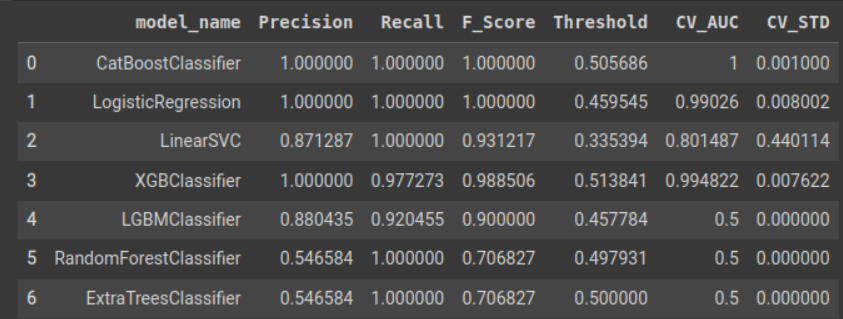

Прогнал датасет через свой пайплайн выбора модели классификации. Гиперпараметры бустингов настраивал с помощью BayesianOptimization. Гиперпараметры бэггингов настраивал с помощью Hyperopt. Линейные модели настраивал с помощью GridSearchCV. Выбрать не из чего :-). Линейные модели не найдут нелинейные связи между признаками. Нелинейные дают либо слишком сильный скор либо очень плохой. Идеальный результат у Катбуста, но бустинги склонны к переобучению. А у QuadraticDiscriminantAnalysis тоже все идеально, и к тому же это нелинейная статистическая модель близкая к байесовскому классификатору, и в отличие от Катбуста не требует настройки гиперпараметров, а значит не требуется валидационная выборка, что особенно важно на столь маленьком датасете. Выбираю QuadraticDiscriminantAnalysis.

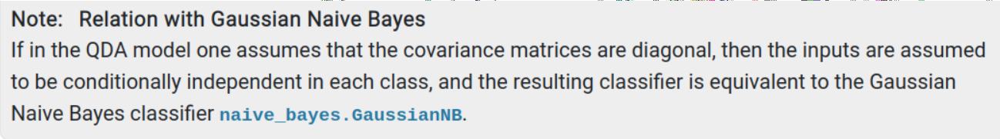

# Permutation Importance

Наконец то добрался до "тяжелой артиллерии" в выборе полезных признаков. Ну все, теперь попрем. Я предпочитаю библиотеку eli5, но она не просто устанавливается. Поэтому возьму реализацию в  sklearn.

In [60]:
train, valid = train_test_split(df_over, random_state=0, train_size=0.7, shuffle=True)

In [61]:
x_train = train.drop(columns=[TARGET_NAME])
y_train = train[TARGET_NAME]
x_valid = valid.drop(columns=[TARGET_NAME])
y_valid = valid[TARGET_NAME]

In [62]:
TARGET_NAME = 'target'

In [63]:
# Обучаю модель на тренировочной выборке
model_QDA = QuadraticDiscriminantAnalysis()
model_QDA.fit(x_train, y_train)

/home/jb/anaconda3/lib/python3.8/site-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear



QuadraticDiscriminantAnalysis()

In [64]:
roc_auc_score(y_valid, model_QDA.predict(x_valid))

0.988

In [65]:
importance = permutation_importance(
    model_QDA, x_valid, y_valid, scoring="roc_auc", n_jobs=-1, random_state=0
)

In [66]:
# вывожу на предсказание признаки, которые следует удалить
importance_scores = pd.DataFrame({
    "features": x_valid.columns,
    "importance-mean": importance.importances_mean,
    "importance-std": importance.importances_std,
})
importance_scores = importance_scores.sort_values(
    by="importance-mean", ascending=False
)
importance_scores = importance_scores.reset_index(drop=True)
decrease_scores = importance_scores[importance_scores["importance-mean"]<=0]
decrease_scores = decrease_scores.reset_index(drop=True)
decrease_scores

,features,importance-mean,importance-std
0,Страна заемщика,0.000000e+00,0.000000e+00
1,Гос. гарантия,0.000000e+00,0.000000e+00
2,Конвертация,0.000000e+00,0.000000e+00
3,id,0.000000e+00,0.000000e+00
4,"Тип бумаги (МСП, Корп., Гос.)",-4.440892e-17,5.438960e-17


In [67]:
x_train.drop(columns=['id', 'Конвертация', 'Тип бумаги (МСП, Корп., Гос.)', 
                      'Страна заемщика'], inplace=True)
x_valid.drop(columns=['id', 'Конвертация', 'Тип бумаги (МСП, Корп., Гос.)', 
                      'Страна заемщика'], inplace=True)

In [68]:
# удаляю их из общей выборки
X_over.drop(columns=['id', 'Конвертация', 'Тип бумаги (МСП, Корп., Гос.)', 
                      'Страна заемщика'], inplace=True)

In [69]:
# проверка
model_QDA = QuadraticDiscriminantAnalysis()

#запустим кросс-валидацию
cv_scores = cross_val_score(model_QDA, X_over, y_over, cv=10, scoring='roc_auc', n_jobs=-1)
cv_score = np.mean(cv_scores)
print('CV score is {}'.format(cv_score))
cv_std = np.std(cv_scores) * 2
print('CV var is {}'.format(cv_std))

CV score is 1.0
CV var is 0.0


# SHAP

Ну и в конце запускаю отличную библиотеку по интерпретации моделей машинного обучения. К сожалению SHAP не поддерживает QuadraticDiscriminantAnalysis, поэтому использую Катбуст.

In [70]:
# категориальные признаки уже закодированы
cat_feats=None

In [71]:
# Если настроить гиперпараметры байесовской оптимизацией, ноутбук растянется еще  на пару сотен строк и потом не откроется в Гитхабе.
# Через API Катбуста использую упрощенную, но достаточно мощную настройку гиперпараметров.
train_dataset = catb.Pool(data=x_train,
                     label=y_train,
                     cat_features=cat_feats)

eval_dataset = catb.Pool(data=x_valid,
                     label=y_valid,
                     cat_features=cat_feats)

model = catb.CatBoostClassifier(iterations=12000,
                           grow_policy="Depthwise",
                           #loss_function = 'RMSE',
                           eval_metric = 'AUC',
                           early_stopping_rounds = 40,
                           random_state=42,
                           cat_features=cat_feats,
                           #task_type="GPU", # закомментировать, если не на GPU
                           #devices='0', # закомментировать, если не на GPU
                           verbose = False,
                           use_best_model=True
                         )

# Fit model
model.fit(train_dataset, eval_set=eval_dataset, logging_level='Silent', plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [72]:
# использовал всего 132 итерации
model.best_iteration_

79

In [73]:
# проверка обучения
roc_auc_score(y_valid, model.predict(x_valid))

0.9956896551724138

In [74]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_valid)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], x_valid.iloc[0,:])

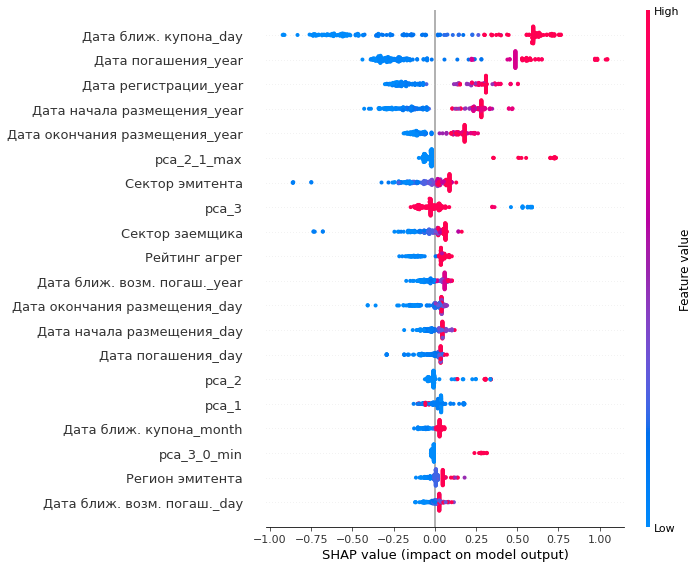

In [75]:
# summarize the effects of all the features
shap.summary_plot(shap_values, x_valid)

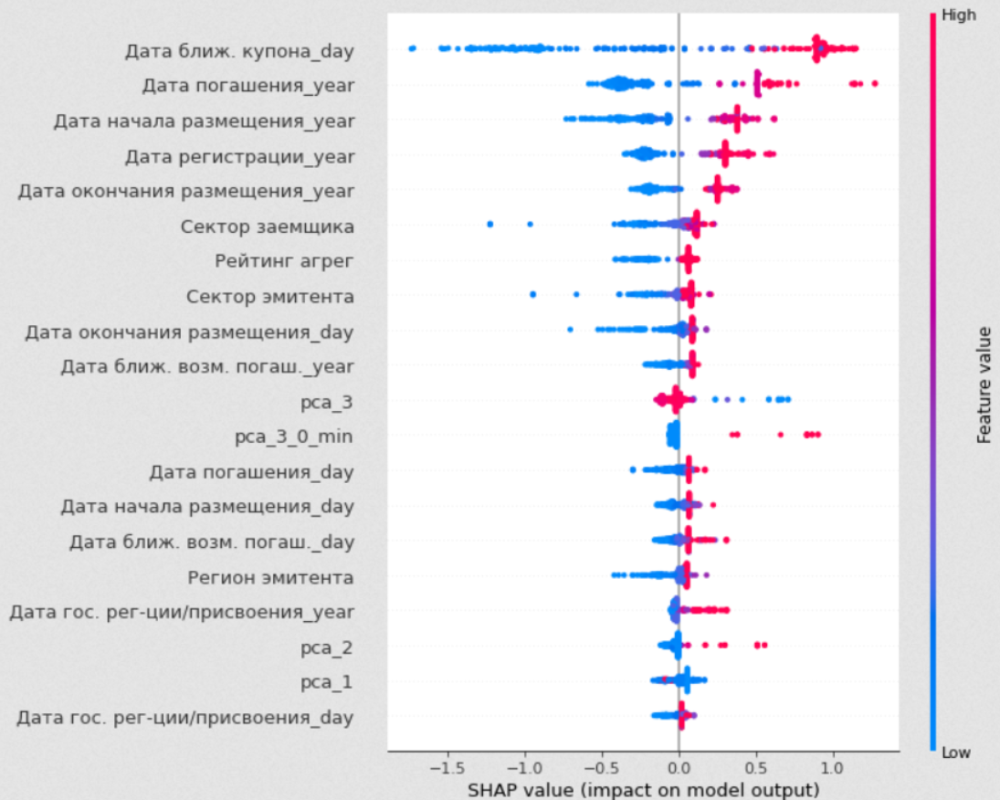

Как его читать:

Вместо того, чтобы использовать типичную гистограмму важности функций, мы используем диаграмму разброса плотности значений SHAP для каждого признака, чтобы определить, какое влияние каждый признак оказывает на выходные данные модели для отдельных наблюдений в валидационном наборе данных. Признаки сортируются по сумме величины SHAP-значений для всех объектов исследуемой выборки. Обратим внимание, что когда точки не помещаются на одной линии, они накапливаются, чтобы показать плотность, а цвет каждой точки представляет значение признака.

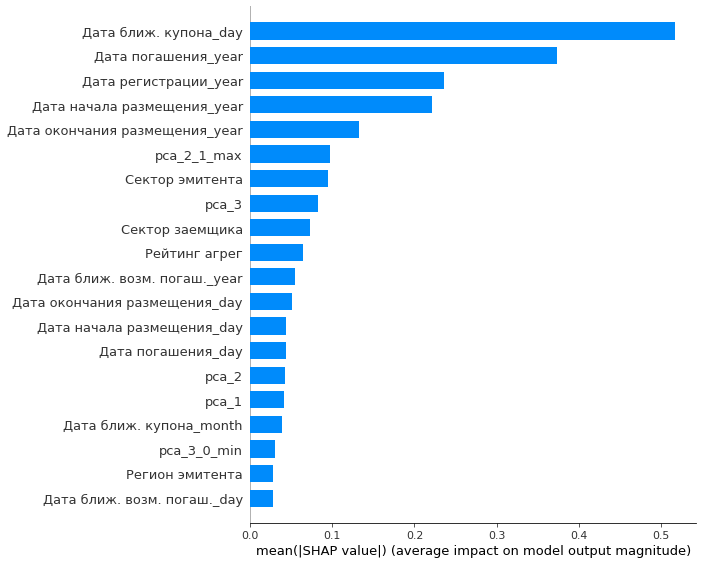

In [76]:
# Берется среднее значение величин SHAP по всему набору данных 
# и отображает его в виде простой столбчатой диаграммы.
shap.summary_plot(shap_values, x_valid, plot_type="bar")

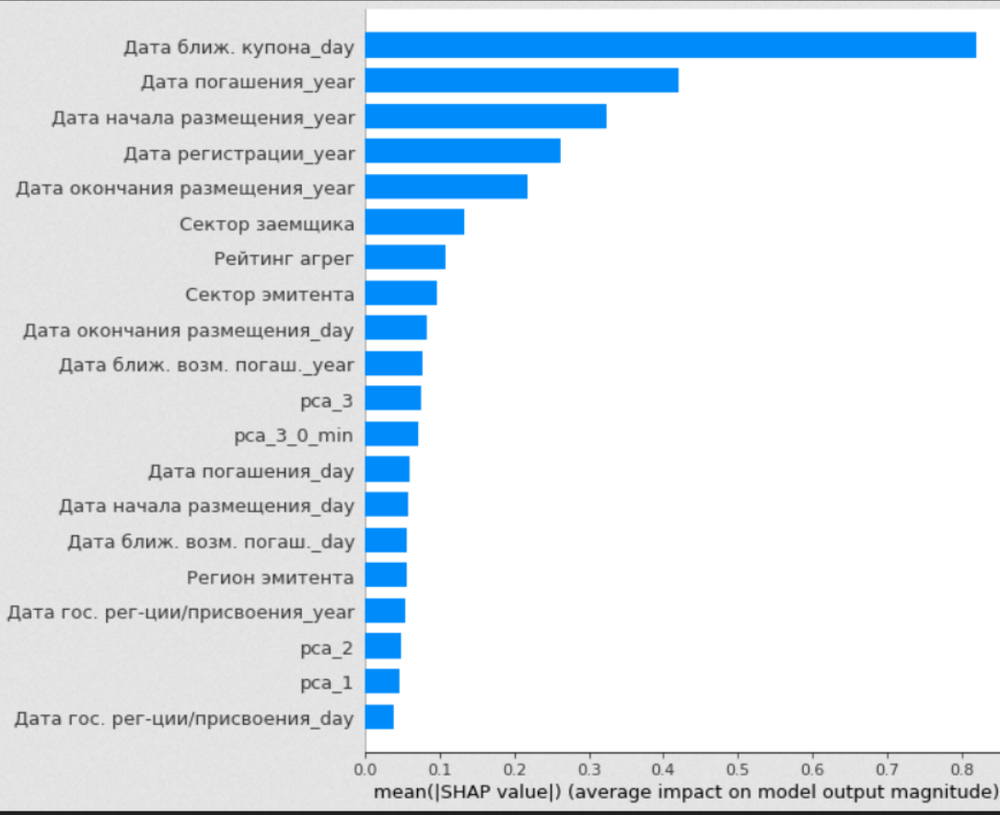

In [77]:
x_valid.columns

Index(['pca_1', 'pca_2', 'pca_3', 'Ломбардный список БР',
       'Кол-во дней со сделками за 5 дней',
       'Кол-во дней со сделками за 10 дней', 'Кол-во купонов в год',
       'Дата начала размещения_dow', 'Дата ближ. возм. погаш._dow',
       'Дата погашения_dow', 'Дата окончания размещения_dow',
       'Дата регистрации_dow', 'Дата ближ. купона_year',
       'Дата начала размещения_day', 'Дата ближ. возм. погаш._year',
       'Дата ближ. возм. погаш._day', 'Дата погашения_year',
       'Дата погашения_day', 'Дата окончания размещения_day',
       'Дата регистрации_day', 'Дата гос. рег-ции/присвоения_day',
       'Дата ближ. купона_day', 'Дата ближ. возм. погаш._month',
       'Дата ближ. купона_month', 'Дата гос. рег-ции/присвоения_month',
       'Дата гос. рег-ции/присвоения_year', 'Дата начала размещения_month',
       'Дата начала размещения_year', 'Дата окончания размещения_month',
       'Дата окончания размещения_year', 'Дата погашения_month',
       'Дата регистрации_month',

SHAP Dependence Plots показывают влияние одного признака на весь набор данных. Они отображают значение функции по сравнению с SHAP-значениями этого признака на многих наблюдениях. SHAP Dependence Plots учитывают эффекты взаимодействия, присутствующие в признаках, и определяются только в областях входного пространства, поддерживаемых данными. Вертикальный разброс SHAP-values для одного признака определяется эффектами взаимодействия, и для выделения возможных взаимодействий выбирается другой признак.

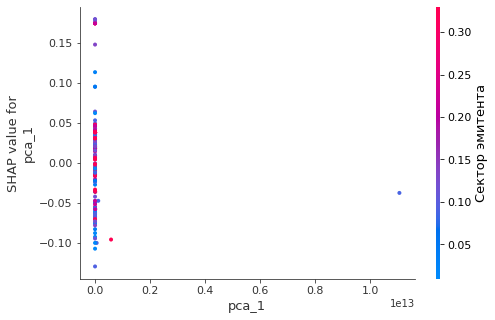

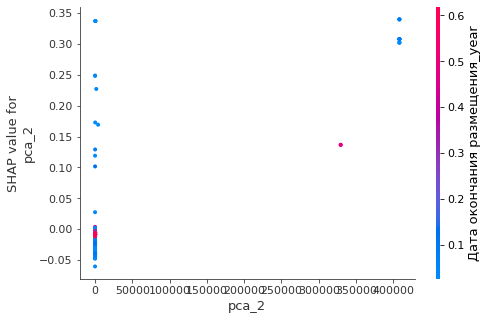

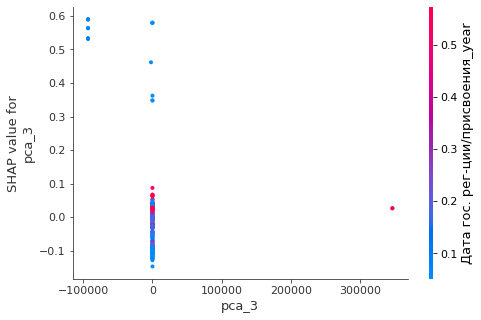

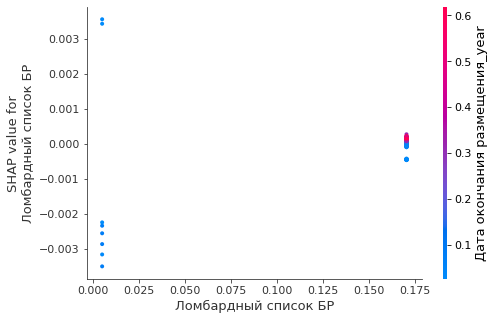

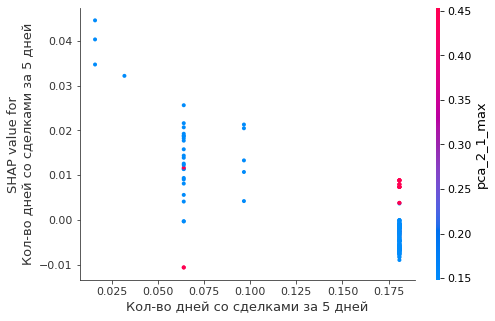

...

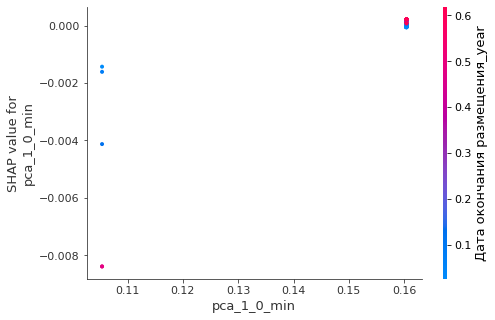

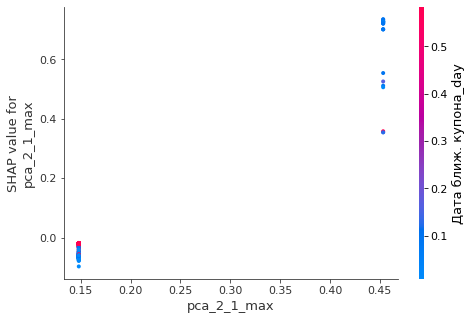

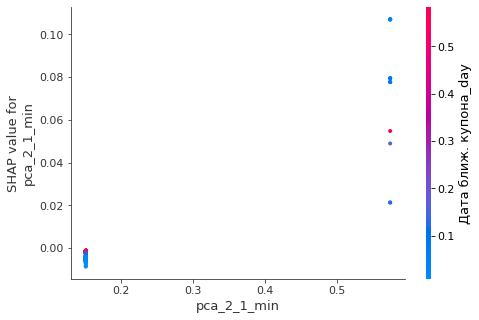

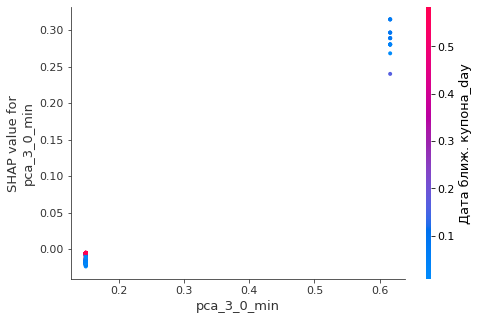

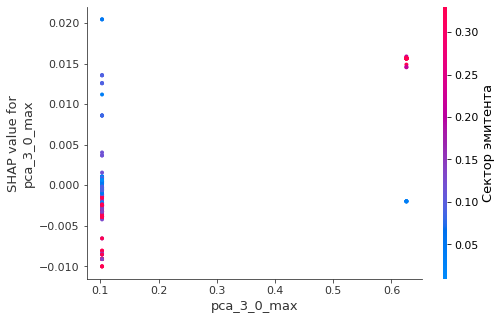

In [78]:
dependence_features = ['pca_1', 'pca_2', 'pca_3', 'Ломбардный список БР',
       'Кол-во дней со сделками за 5 дней',
       'Кол-во дней со сделками за 10 дней', 'Кол-во купонов в год',
       'Дата начала размещения_dow', 'Дата ближ. возм. погаш._dow',
       'Дата погашения_dow', 'Дата окончания размещения_dow',
       'Дата регистрации_dow', 'Дата ближ. купона_year',
       'Дата начала размещения_day', 'Дата ближ. возм. погаш._year',
       'Дата ближ. возм. погаш._day', 'Дата погашения_year',
       'Дата погашения_day', 'Дата окончания размещения_day',
       'Дата регистрации_day', 'Дата гос. рег-ции/присвоения_day',
       'Дата ближ. купона_day', 'Дата ближ. возм. погаш._month',
       'Дата ближ. купона_month', 'Дата гос. рег-ции/присвоения_month',
       'Дата гос. рег-ции/присвоения_year', 'Дата начала размещения_month',
       'Дата начала размещения_year', 'Дата окончания размещения_month',
       'Дата окончания размещения_year', 'Дата погашения_month',
       'Дата регистрации_month', 'Дата регистрации_year', 'CFI',
       'Сектор заемщика', 'Регион эмитента', 'Сектор эмитента', 'Тип купона',
       'Валюта номинала', 'Тип облигации', 'Для неквал. инвесторов',
       'Форма выпуска, eng', 'Тип по классиф. БР', 'Вид залога',
       'Структурированность', 'Гос. гарантия', 'Вид обеспечения',
       'Старшинство секьюритизации', 'Сектор повышенного инвест. риска',
       'Сектор роста', 'Рейтинг агрег', 'pca_1_0_max', 'pca_1_0_min',
       'pca_2_1_max', 'pca_2_1_min', 'pca_3_0_min', 'pca_3_0_max']
for name in dependence_features:
    shap.dependence_plot(name, shap_values, x_valid, display_features=x_valid)


Basic decision plot features

    ось x представляет результат работы модели. В этом случае единицы являются log-odds.

    ось y показывает признаки модели. По умолчанию, признаки упорядочены по убыванию важности. Важность рассчитывается по нанесенным на график наблюдениям. Обычно, такой расчет отличается от порядка важности признаков для всего набора данных.

    Прогноз каждого наблюдения представлен цветной линией. Вверху графика каждая линия пересекает ось абсцисс на уровне предсказанного значения соответствующего наблюдения. Это значение определяет цвет линии на спектре.

    При перемещении снизу графика вверх, значения SHAP для каждого объекта добавляются к базовому значению модели. Это показывает, как каждый признак способствует общему прогнозу.

# Исследование SHAP линейной моделью

In [79]:
# Посмотрим как распределятся признаки без учета нелинейных связей
lr_model = LogisticRegression(random_state=1, solver="liblinear")
lr_params = {
    "penalty": ["l1", "l2"],
    "C": [10e-3, 10e-2, 10e-1, 1, 10, 100, 1000]
}
GSCV_lr = GridSearchCV(lr_model, lr_params, n_jobs=-1, cv=5, scoring='roc_auc')
GSCV_lr.fit(x_train, y_train)
print(GSCV_lr.best_params_)
lr_best = GSCV_lr.best_estimator_

{'C': 10, 'penalty': 'l1'}


/home/jb/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



In [80]:
# проверка обучения
roc_auc_score(y_valid, lr_best.predict(x_valid))

0.9913793103448275

In [81]:
explainer = shap.Explainer(lr_best, x_train, feature_names=list(x_train.columns))
shap_values = explainer(x_valid)

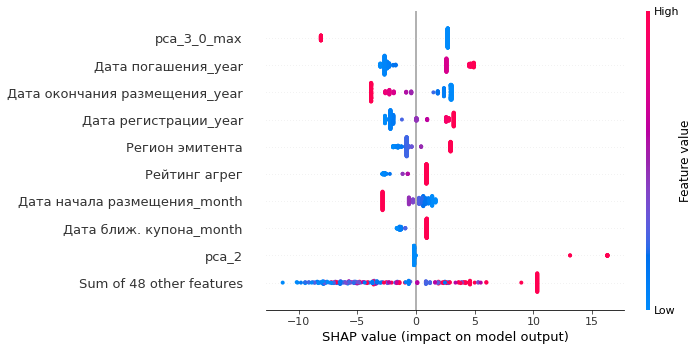

In [82]:
shap.plots.beeswarm(shap_values)

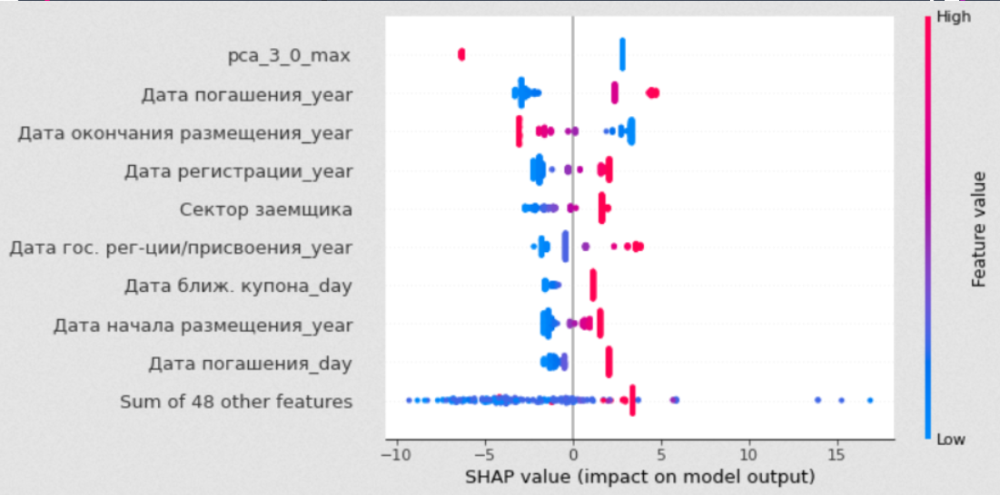

У линейной модели ранжировка признаков несколько изменилась, но по прежнему превалируют временные признаки. Даже в случае переобучения на временных признаках, временные признаки для этого датасета очень важны. Нужно пробовать создавать датасет с признаками, изменяющимися во времени.

In [90]:
# LinearDiscriminantAnalysis

In [84]:
model_LDA = LinearDiscriminantAnalysis(solver='svd')
model_LDA.fit(x_train, y_train)

LinearDiscriminantAnalysis()

In [85]:
explainer = shap.Explainer(model_LDA, x_train, feature_names=list(x_train.columns))
shap_values = explainer(x_valid)

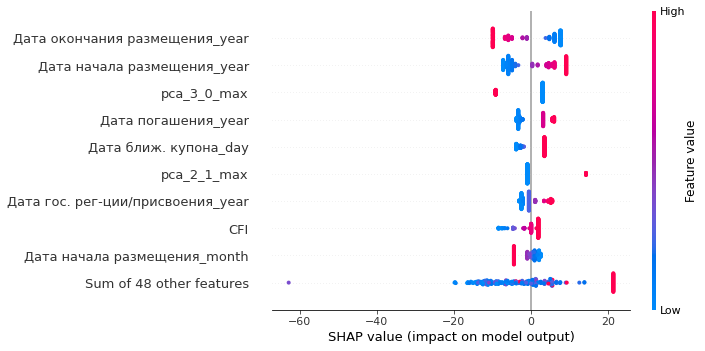

In [86]:
shap.plots.beeswarm(shap_values)

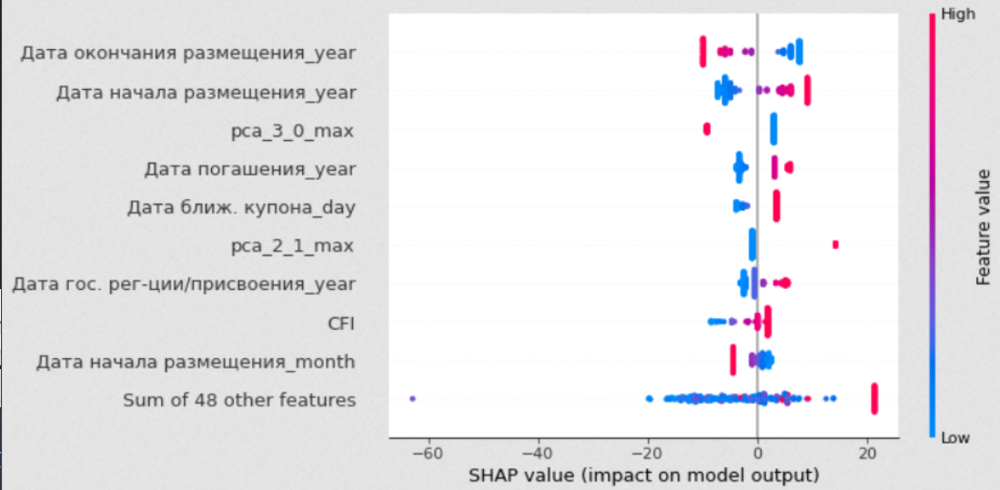

In [91]:
# QuadraticDiscriminantAnalysis

In [87]:
model_QDA = QuadraticDiscriminantAnalysis()
model_QDA.fit(x_train, y_train)

/home/jb/anaconda3/lib/python3.8/site-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear



QuadraticDiscriminantAnalysis()

In [88]:
explainer = shap.Explainer(model_QDA, x_train, feature_names=list(x_train.columns))
shap_values = explainer(x_valid)

Exception: The passed model is not callable and cannot be analyzed directly with the given masker! Model: QuadraticDiscriminantAnalysis()

In [ ]:
QuadraticDiscriminantAnalysis к сожалению не поддерживается

In [92]:
!pip freeze pred_requirements.txt

absl-py==1.2.0
alabaster @ file:///home/ktietz/src/ci/alabaster_1611921544520/work
anaconda-client @ file:///tmp/build/80754af9/anaconda-client_1635330891925/work
anaconda-navigator==2.3.2
anaconda-project @ file:///tmp/build/80754af9/anaconda-project_1626085644852/work
annoy==1.17.0
anyio==3.6.1
apache-beam==2.41.0
appdirs==1.4.4
APScheduler==3.6.3
argh==0.26.2
argon2-cffi @ file:///tmp/build/80754af9/argon2-cffi_1613037097816/work
asn1crypto @ file:///tmp/build/80754af9/asn1crypto_1596577642040/work
astroid @ file:///tmp/build/80754af9/astroid_1628063142195/work
astropy @ file:///tmp/build/80754af9/astropy_1629829212064/work
astunparse==1.6.3
async-generator @ file:///home/ktietz/src/ci/async_generator_1611927993394/work
atomicwrites==1.4.0
attrs @ file:///tmp/build/80754af9/attrs_1620827162558/work
autopep8 @ file:///tmp/build/80754af9/autopep8_1596578164842/work
auxiliary==1.0.1
avro-python3==1.10.2
Babel @ file:///tmp/build/80754af9/babel_1620871417480/work
backcall @ file:///home

absl-py==1.2.0
alabaster @ file:///home/ktietz/src/ci/alabaster_1611921544520/work
anaconda-client @ file:///tmp/build/80754af9/anaconda-client_1635330891925/work
anaconda-navigator==2.3.2
anaconda-project @ file:///tmp/build/80754af9/anaconda-project_1626085644852/work
annoy==1.17.0
anyio==3.6.1
apache-beam==2.41.0
appdirs==1.4.4
APScheduler==3.6.3
argh==0.26.2
argon2-cffi @ file:///tmp/build/80754af9/argon2-cffi_1613037097816/work
asn1crypto @ file:///tmp/build/80754af9/asn1crypto_1596577642040/work
astroid @ file:///tmp/build/80754af9/astroid_1628063142195/work
astropy @ file:///tmp/build/80754af9/astropy_1629829212064/work
astunparse==1.6.3
async-generator @ file:///home/ktietz/src/ci/async_generator_1611927993394/work
atomicwrites==1.4.0
attrs @ file:///tmp/build/80754af9/attrs_1620827162558/work
autopep8 @ file:///tmp/build/80754af9/autopep8_1596578164842/work
auxiliary==1.0.1
avro-python3==1.10.2
Babel @ file:///tmp/build/80754af9/babel_1620871417480/work
backcall @ file:///home/ktietz/src/ci/backcall_1611930011877/work
backports.functools-lru-cache @ file:///tmp/build/80754af9/backports.functools_lru_cache_1618170165463/work
backports.shutil-get-terminal-size @ file:///tmp/build/80754af9/backports.shutil_get_terminal_size_1608222128777/work
backports.tempfile @ file:///home/linux1/recipes/ci/backports.tempfile_1610991236607/work
backports.weakref==1.0.post1
backports.zoneinfo==0.2.1
bayesian-optimization==1.4.2
beautifulsoup4 @ file:///tmp/build/80754af9/beautifulsoup4_1631874778482/work
behave==1.2.6
bitarray @ file:///tmp/build/80754af9/bitarray_1629132843052/work
bkcharts==0.2
black==19.10b0
bleach @ file:///tmp/build/80754af9/bleach_1628110601003/work
bokeh @ file:///tmp/build/80754af9/bokeh_1635324464916/work
boto==2.49.0
Bottleneck==1.3.2
brotlipy==0.7.0
cachetools==4.2.2
cachier==1.5.3
catboost==0.25.1
category-encoders==2.3.0
certifi==2022.6.15
cffi @ file:///tmp/build/80754af9/cffi_1613246945912/work
chardet @ file:///tmp/build/80754af9/chardet_1607706746162/work
charset-normalizer==2.0.12
chime==0.5.3
click==7.1.2
click-plugins==1.1.1
cligj==0.7.2
cloudpickle==2.1.0
clyent==1.2.2
colorama==0.4.6
colorlover==0.3.0
conda==22.9.0
conda-build==3.23.1
conda-content-trust @ file:///tmp/abs_5952f1c8-355c-4855-ad2e-538535021ba5h26t22e5/croots/recipe/conda-content-trust_1658126371814/work
conda-pack @ file:///tmp/build/80754af9/conda-pack_1611163042455/work
conda-package-handling @ file:///tmp/build/80754af9/conda-package-handling_1618262148928/work
conda-repo-cli==1.0.5
conda-token @ file:///tmp/build/80754af9/conda-token_1620076980546/work
conda-verify==3.4.2
contextlib2 @ file:///Users/ktietz/demo/mc3/conda-bld/contextlib2_1630668244042/work
convertdate==2.3.2
crcmod==1.7
cryptography @ file:///tmp/build/80754af9/cryptography_1635366571107/work
cufflinks==0.17.3
cycler==0.10.0
Cython @ file:///tmp/build/80754af9/cython_1636035786592/work
cytoolz==0.11.0
dask==2021.10.0
dask-glm==0.2.0
dask-ml @ file:///home/conda/feedstock_root/build_artifacts/dask-ml_1653682129510/work
DAWG-Python==0.7.2
debugpy @ file:///tmp/build/80754af9/debugpy_1629222698064/work
decorator @ file:///tmp/build/80754af9/decorator_1632776554403/work
defusedxml @ file:///tmp/build/80754af9/defusedxml_1615228127516/work
delayed==0.11.0b1
diff-match-patch @ file:///Users/ktietz/demo/mc3/conda-bld/diff-match-patch_1630511840874/work
dill==0.3.1.1
distributed @ file:///tmp/build/80754af9/distributed_1635968203122/work
dm-tree==0.1.7
docopt==0.6.2
docutils @ file:///tmp/build/80754af9/docutils_1620827984873/work
emoji==2.2.0
entrypoints==0.3
et-xmlfile==1.1.0
etils==0.7.1
facenet-pytorch==2.5.2
fastavro==1.6.0
fastcache==1.1.0
feature-engine==1.1.2
featuretools==0.27.0
filelock==3.7.1
Fiona==1.8.20
flake8 @ file:///tmp/build/80754af9/flake8_1601911421857/work
Flask @ file:///home/ktietz/src/ci/flask_1611932660458/work
flatbuffers==1.12
fonttools==4.25.0
fsspec @ file:///tmp/build/80754af9/fsspec_1636116461911/work
future==0.18.2
fuzzy-c-means==1.6.3
gast==0.4.0
geopandas==0.10.2
gevent @ file:///tmp/build/80754af9/gevent_1628273677693/work
gin-config==0.5.0
glob2 @ file:///home/linux1/recipes/ci/glob2_1610991677669/work
gmpy2==2.0.8
google-api-core==2.8.2
google-api-python-client==2.58.0
google-auth==2.10.0
google-auth-httplib2==0.1.0
google-auth-oauthlib==0.4.6
google-pasta==0.2.0
googleapis-common-protos==1.56.4
graphviz==0.16
greenlet @ file:///tmp/build/80754af9/greenlet_1628887725296/work
grpcio==1.47.0
h11==0.12.0
h5py==3.7.0
hdfs==2.7.0
HeapDict @ file:///Users/ktietz/demo/mc3/conda-bld/heapdict_1630598515714/work
hijri-converter==2.2.2
hiredis==2.0.0
holidays==0.11.3.1
html5lib @ file:///Users/ktietz/demo/mc3/conda-bld/html5lib_1629144453894/work
httpcore==0.15.0
httplib2==0.20.4
httpx==0.23.0
huggingface-hub==0.8.1
hyperopt==0.2.5
idna==3.3
imagecodecs @ file:///tmp/build/80754af9/imagecodecs_1635529103369/work
imageio @ file:///tmp/build/80754af9/imageio_1617700267927/work
imagesize @ file:///Users/ktietz/demo/mc3/conda-bld/imagesize_1628863108022/work
imbalanced-learn==0.8.0
imblearn==0.0
immutabledict==2.2.1
implicit==0.4.8
importlib-metadata==4.12.0
importlib-resources==5.9.0
iniconfig @ file:///home/linux1/recipes/ci/iniconfig_1610983019677/work
intervaltree @ file:///Users/ktietz/demo/mc3/conda-bld/intervaltree_1630511889664/work
ipykernel @ file:///tmp/build/80754af9/ipykernel_1633545412716/work/dist/ipykernel-6.4.1-py3-none-any.whl
ipymarkup==0.9.0
ipython @ file:///tmp/build/80754af9/ipython_1635943998418/work
ipython-genutils @ file:///tmp/build/80754af9/ipython_genutils_1606773439826/work
ipywidgets @ file:///tmp/build/80754af9/ipywidgets_1634143127070/work
isort @ file:///tmp/build/80754af9/isort_1628603791788/work
itsdangerous @ file:///tmp/build/80754af9/itsdangerous_1621432558163/work
jdcal @ file:///Users/ktietz/demo/mc3/conda-bld/jdcal_1630584345063/work
jedi @ file:///tmp/build/80754af9/jedi_1606932564285/work
jeepney @ file:///tmp/build/80754af9/jeepney_1627537048313/work
Jinja2 @ file:///tmp/build/80754af9/jinja2_1612213139570/work
joblib @ file:///tmp/build/80754af9/joblib_1635411271373/work
json5 @ file:///tmp/build/80754af9/json5_1624432770122/work
jsonschema @ file:///Users/ktietz/demo/mc3/conda-bld/jsonschema_1630511932244/work
jupyter==1.0.0
jupyter-client @ file:///tmp/build/80754af9/jupyter_client_1630690655192/work
jupyter-console @ file:///tmp/build/80754af9/jupyter_console_1616615302928/work
jupyter-core @ file:///tmp/build/80754af9/jupyter_core_1636524756443/work
jupyter-server @ file:///tmp/build/80754af9/jupyter_server_1616083640759/work
jupyterlab @ file:///tmp/build/80754af9/jupyterlab_1635799997693/work
jupyterlab-pygments @ file:///tmp/build/80754af9/jupyterlab_pygments_1601490720602/work
jupyterlab-server @ file:///tmp/build/80754af9/jupyterlab_server_1633419203660/work
jupyterlab-widgets @ file:///tmp/build/80754af9/jupyterlab_widgets_1609884341231/work
jupyterthemes==0.20.0
kaggle==1.5.12
keras==2.9.0
keras-nightly==2.5.0.dev2021032900
Keras-Preprocessing==1.1.2
keyring @ file:///tmp/build/80754af9/keyring_1629321557132/work
kiwisolver @ file:///tmp/build/80754af9/kiwisolver_1612282420641/work
korean-lunar-calendar==0.2.1
lazy-object-proxy @ file:///tmp/build/80754af9/lazy-object-proxy_1616526917483/work
lesscpy==0.15.0
libarchive-c @ file:///tmp/build/80754af9/python-libarchive-c_1617780486945/work
libclang==14.0.6
lightfm==1.16
lightgbm==3.2.1
llvmlite==0.36.0
locket==0.2.1
lockfile==0.12.2
loguru==0.5.3
luigi==3.0.3
lvis==0.5.3
lxml @ file:///tmp/build/80754af9/lxml_1616443220220/work
Markdown==3.4.1
MarkupSafe @ file:///tmp/build/80754af9/markupsafe_1621528148836/work
matplotlib @ file:///tmp/build/80754af9/matplotlib-suite_1634667019719/work
matplotlib-inline @ file:///tmp/build/80754af9/matplotlib-inline_1628242447089/work
mccabe==0.6.1
missingno==0.5.2
mistune==0.8.4
mkl-fft==1.3.1
mkl-random @ file:///tmp/build/80754af9/mkl_random_1626186064646/work
mkl-service==2.4.0
ml-metrics==0.1.4
mnist==0.2.2
mock @ file:///tmp/build/80754af9/mock_1607622725907/work
more-itertools @ file:///tmp/build/80754af9/more-itertools_1635423142362/work
mpmath==1.2.1
msgpack @ file:///tmp/build/80754af9/msgpack-python_1612287151062/work
multipledispatch==0.6.0
munch==2.5.0
munkres==1.1.4
mypy-extensions==0.4.3
natasha==1.5.0
navec==0.10.0
navigator-updater==0.2.1
nbclassic @ file:///tmp/build/80754af9/nbclassic_1616085367084/work
nbclient @ file:///tmp/build/80754af9/nbclient_1614364831625/work
nbconvert @ file:///tmp/build/80754af9/nbconvert_1624479060632/work
nbformat @ file:///tmp/build/80754af9/nbformat_1617383369282/work
nest-asyncio @ file:///tmp/build/80754af9/nest-asyncio_1613680548246/work
networkx @ file:///tmp/build/80754af9/networkx_1633639043937/work
nltk==3.7
nose @ file:///tmp/build/80754af9/nose_1606773131901/work
notebook @ file:///tmp/build/80754af9/notebook_1635411636904/work
numba @ file:///tmp/build/80754af9/numba_1616774046117/work
numexpr @ file:///tmp/build/80754af9/numexpr_1618856167419/work
numpy==1.17.3
numpydoc @ file:///tmp/build/80754af9/numpydoc_1605117425582/work
oauth2client==4.1.3
oauthlib==3.2.0
object-detection @ file:///home/jb/TensorFlow/models/research
olefile @ file:///Users/ktietz/demo/mc3/conda-bld/olefile_1629805411829/work
opencv-python==4.5.5.64
opencv-python-headless==4.5.2.52
openpyxl @ file:///tmp/build/80754af9/openpyxl_1632777717936/work
opt-einsum==3.3.0
orjson==3.8.0
packaging==21.3
pandas==1.3.4
pandocfilters @ file:///tmp/build/80754af9/pandocfilters_1605120460739/work
parse==1.19.0
parse-type==0.6.0
parso==0.7.0
partd @ file:///tmp/build/80754af9/partd_1618000087440/work
path @ file:///tmp/build/80754af9/path_1623603875173/work
pathlib @ file:///Users/ktietz/demo/mc3/conda-bld/pathlib_1629713961906/work
pathlib2 @ file:///tmp/build/80754af9/pathlib2_1625585678054/work
pathspec==0.7.0
pathtools @ file:///Users/ktietz/demo/mc3/conda-bld/pathtools_1629713893697/work
patsy==0.5.2
pep8==1.7.1
pexpect @ file:///tmp/build/80754af9/pexpect_1605563209008/work
pickleshare @ file:///tmp/build/80754af9/pickleshare_1606932040724/work
Pillow==8.4.0
pkginfo==1.7.1
plotly==4.14.3
pluggy @ file:///tmp/build/80754af9/pluggy_1615976321666/work
plumbum==1.7.1
ply==3.11
portalocker==2.5.1
prometheus-client @ file:///tmp/build/80754af9/prometheus_client_1623189609245/work
promise==2.3
prompt-toolkit @ file:///tmp/build/80754af9/prompt-toolkit_1633440160888/work
proto-plus==1.22.1
protobuf==3.19.4
psutil @ file:///tmp/build/80754af9/psutil_1612298023621/work
ptyprocess @ file:///tmp/build/80754af9/ptyprocess_1609355006118/work/dist/ptyprocess-0.7.0-py2.py3-none-any.whl
pullenti==3.23
pullenti-client==0.6.0
pullenti-wrapper==0.9.0
py @ file:///tmp/build/80754af9/py_1607971587848/work
py-cpuinfo==8.0.0
pyarrow==7.0.0
pyasn1==0.4.8
pyasn1-modules==0.2.8
pycocotools==2.0.4
pycodestyle @ file:///home/ktietz/src/ci_mi/pycodestyle_1612807597675/work
pyconll==3.1.0
pycosat==0.6.3
pycparser @ file:///tmp/build/80754af9/pycparser_1636541352034/work
pycurl==7.44.1
pydantic==1.10.2
pydocstyle @ file:///tmp/build/80754af9/pydocstyle_1621600989141/work
pydot==1.4.2
pyerfa @ file:///tmp/build/80754af9/pyerfa_1621560806183/work
pyflakes @ file:///home/ktietz/src/ci_ipy2/pyflakes_1612551159640/work
Pygments @ file:///tmp/build/80754af9/pygments_1629234116488/work
PyJWT @ file:///opt/conda/conda-bld/pyjwt_1657544592787/work
pylint @ file:///tmp/build/80754af9/pylint_1627536788098/work
pyls-black @ file:///tmp/build/80754af9/pyls-black_1607553132291/work
pyls-spyder @ file:///tmp/build/80754af9/pyls-spyder_1608134179673/work
PyMeeus==0.5.11
pymongo==3.12.1
pymorphy2==0.9.1
pymorphy2-dicts-ru==2.4.417127.4579844
pyodbc===4.0.0-unsupported
pyOpenSSL @ file:///tmp/build/80754af9/pyopenssl_1635333100036/work
pyparsing @ file:///opt/conda/conda-bld/pyparsing_1661452539315/work
pyproj==3.2.1
PyQt5==5.12
PyQt5-Qt5==5.15.2
PyQt5_sip==4.19.19
PyQtWebEngine==5.12
pyrsistent @ file:///tmp/build/80754af9/pyrsistent_1636110947380/work
PySocks @ file:///tmp/build/80754af9/pysocks_1605305779399/work
pytest==6.2.4
python-daemon==2.3.0
python-dateutil @ file:///tmp/build/80754af9/python-dateutil_1626374649649/work
python-jsonrpc-server @ file:///tmp/build/80754af9/python-jsonrpc-server_1600278539111/work
python-language-server @ file:///tmp/build/80754af9/python-language-server_1607972495879/work
python-rex==0.4
python-slugify==6.1.2
python-telegram-bot==13.13
pytz==2022.1
pytz-deprecation-shim==0.1.0.post0
PyWavelets @ file:///tmp/build/80754af9/pywavelets_1601658317819/work
pyxdg @ file:///tmp/build/80754af9/pyxdg_1603822279816/work
PyYAML==5.4.1
pyzmq @ file:///tmp/build/80754af9/pyzmq_1628276010766/work
QDarkStyle @ file:///tmp/build/80754af9/qdarkstyle_1617386714626/work
QtAwesome @ file:///tmp/build/80754af9/qtawesome_1615991616277/work
qtconsole @ file:///tmp/build/80754af9/qtconsole_1632739723211/work
QtPy @ file:///tmp/build/80754af9/qtpy_1629397026935/work
razdel==0.5.0
redis==3.5.3
regex==2022.7.25
requests @ file:///tmp/build/80754af9/requests_1629994808627/work
requests-oauthlib==1.3.1
retrying==1.3.3
rfc3986==1.5.0
rope @ file:///tmp/build/80754af9/rope_1623703006312/work
rsa==4.9
Rtree @ file:///tmp/build/80754af9/rtree_1618420845272/work
ruamel-yaml-conda @ file:///tmp/build/80754af9/ruamel_yaml_1616016699510/work
sacrebleu==2.2.0
scikit-fuzzy==0.4.2
scikit-image==0.18.3
scikit-learn @ file:///tmp/build/80754af9/scikit-learn_1642617107864/work
scipy @ file:///tmp/build/80754af9/scipy_1630606796110/work
seaborn @ file:///tmp/build/80754af9/seaborn_1629307859561/work
SecretStorage @ file:///tmp/build/80754af9/secretstorage_1614022784285/work
Send2Trash @ file:///tmp/build/80754af9/send2trash_1632406701022/work
sentencepiece==0.1.97
seqeval==1.2.2
shap==0.40.0
Shapely==1.8.0
simplegeneric==0.8.1
singledispatch @ file:///tmp/build/80754af9/singledispatch_1629321204894/work
sip==4.19.13
six @ file:///tmp/build/80754af9/six_1644875935023/work
slicer==0.0.7
slovnet==0.6.0
sniffio @ file:///tmp/build/80754af9/sniffio_1614030475067/work
snowballstemmer @ file:///tmp/build/80754af9/snowballstemmer_1611258885636/work
sortedcollections @ file:///tmp/build/80754af9/sortedcollections_1611172717284/work
sortedcontainers @ file:///tmp/build/80754af9/sortedcontainers_1623949099177/work
soupsieve @ file:///tmp/build/80754af9/soupsieve_1616183228191/work
Sphinx==4.2.0
sphinxcontrib-applehelp @ file:///home/ktietz/src/ci/sphinxcontrib-applehelp_1611920841464/work
sphinxcontrib-devhelp @ file:///home/ktietz/src/ci/sphinxcontrib-devhelp_1611920923094/work
sphinxcontrib-htmlhelp @ file:///tmp/build/80754af9/sphinxcontrib-htmlhelp_1623945626792/work
sphinxcontrib-jsmath @ file:///home/ktietz/src/ci/sphinxcontrib-jsmath_1611920942228/work
sphinxcontrib-qthelp @ file:///home/ktietz/src/ci/sphinxcontrib-qthelp_1611921055322/work
sphinxcontrib-serializinghtml @ file:///tmp/build/80754af9/sphinxcontrib-serializinghtml_1624451540180/work
sphinxcontrib-websupport @ file:///tmp/build/80754af9/sphinxcontrib-websupport_1597081412696/work
spyder @ file:///tmp/build/80754af9/spyder_1607704268920/work
spyder-kernels @ file:///tmp/build/80754af9/spyder-kernels_1614030590686/work
SQLAlchemy @ file:///tmp/build/80754af9/sqlalchemy_1626941010864/work
stanza==1.4.2
statsmodels @ file:///tmp/build/80754af9/statsmodels_1635163029030/work
stop-words==2018.7.23
sympy @ file:///tmp/build/80754af9/sympy_1635237063176/work
tables==3.6.1
tabulate==0.8.10
tb-nightly==2.11.0a20220830
tblib @ file:///Users/ktietz/demo/mc3/conda-bld/tblib_1629402031467/work
telegram==0.0.1
tenacity==6.3.1
tensorboard==2.9.1
tensorboard-data-server==0.6.1
tensorboard-plugin-wit==1.8.1
tensorflow==2.9.1
tensorflow-addons==0.18.0
tensorflow-datasets==4.6.0
tensorflow-estimator==2.9.0
tensorflow-hub==0.12.0
tensorflow-io==0.26.0
tensorflow-io-gcs-filesystem==0.26.0
tensorflow-metadata==1.10.0
tensorflow-model-optimization==0.7.3
tensorflow-text==2.9.0
tensorflow-text-nightly==2.11.0.dev20220829
termcolor==1.1.0
terminado==0.9.4
testpath @ file:///tmp/build/80754af9/testpath_1624638946665/work
text-unidecode==1.3
tf-estimator-nightly==2.11.0.dev2022083008
tf-models-nightly==2.9.0.dev20220830
tf-models-official==2.9.2
tf-nightly==2.11.0.dev20220830
tf-slim==1.1.0
threadpoolctl @ file:///Users/ktietz/demo/mc3/conda-bld/threadpoolctl_1629802263681/work
three-merge @ file:///tmp/build/80754af9/three-merge_1607553261110/work
tifffile @ file:///tmp/build/80754af9/tifffile_1627275862826/work
tokenizers==0.12.1
toml @ file:///tmp/build/80754af9/toml_1616166611790/work
toolz @ file:///tmp/build/80754af9/toolz_1636545406491/work
torch==1.11.0
torchvision==0.12.0
tornado==6.2
tqdm==4.64.0
traitlets @ file:///tmp/build/80754af9/traitlets_1632522747050/work
transformers==4.21.1
typed-ast @ file:///tmp/build/80754af9/typed-ast_1624953673417/work
typeguard==2.13.3
typer==0.3.2
typing_extensions @ file:///tmp/abs_ben9emwtky/croots/recipe/typing_extensions_1659638822008/work
tzdata==2022.1
tzlocal==4.2
ujson @ file:///tmp/build/80754af9/ujson_1611259522456/work
unicodecsv==0.14.1
updater==0.3.2
uritemplate==4.1.1
urllib3==1.26.11
watchdog==2.1.9
wcwidth @ file:///Users/ktietz/demo/mc3/conda-bld/wcwidth_1629357192024/work
webencodings==0.5.1
Werkzeug==2.2.1
widgetsnbextension==3.5.1
wrapt==1.14.1
wurlitzer @ file:///tmp/build/80754af9/wurlitzer_1626947794172/work
xgboost==1.4.1
xlrd @ file:///tmp/build/80754af9/xlrd_1608072521494/work
XlsxWriter @ file:///tmp/build/80754af9/xlsxwriter_1636633762820/work
xlwt==1.3.0
xmltodict @ file:///Users/ktietz/demo/mc3/conda-bld/xmltodict_1629301980723/work
yapf @ file:///tmp/build/80754af9/yapf_1615749224965/work
yargy==0.15.1
zict==2.0.0
zipp==3.8.1
zope.event==4.5.0
zope.interface @ file:///tmp/build/80754af9/zope.interface_1625035545636/work

На всякий случай сохранил файл  requirements. Для копирования перевести ячейку в значение "Код".